# This notebook reproduces the results in Section 3.1 Symbolic Formulas

## Define Brain-inspired Linear layer and MLP

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from matplotlib.patches import Ellipse, Circle

seed = 2
np.random.seed(seed)
torch.manual_seed(seed)

#torch.set_default_tensor_type(torch.DoubleTensor)


class BioLinear(nn.Module):
    # BioLinear is just Linear, but each neuron comes with coordinates.
    def __init__(self, in_dim, out_dim, in_fold=1, out_fold=1):
        super(BioLinear, self).__init__()
        self.in_dim = in_dim
        self.out_dim = out_dim
        self.linear = nn.Linear(in_dim, out_dim)
        self.in_fold = in_fold # in_fold is the number of folds applied to input vectors. It only affects coordinates, not computations.
        self.out_fold = out_fold # out_fold is the number of folds applied to output vectors. It only affects coordinates, not computations.
        assert in_dim % in_fold == 0
        assert out_dim % out_fold == 0
        #compute in_cor, shape: (in_dim)
        in_dim_fold = int(in_dim/in_fold)
        out_dim_fold = int(out_dim/out_fold)
        self.in_coordinates = torch.tensor(list(np.linspace(1/(2*in_dim_fold), 1-1/(2*in_dim_fold), num=in_dim_fold))*in_fold, dtype=torch.float) # place input neurons in 1D Euclidean space
        self.out_coordinates = torch.tensor(list(np.linspace(1/(2*out_dim_fold), 1-1/(2*out_dim_fold), num=out_dim_fold))*out_fold, dtype=torch.float) # place output neurons in 1D Euclidean space
        self.input = None
        self.output = None
        
    def forward(self, x):
        self.input = x.clone()
        self.output = self.linear(x).clone()
        return self.output
    
    
class BioMLP(nn.Module):
    # BioMLP is just MLP, but each neuron comes with coordinates.
    def __init__(self, in_dim=2, out_dim=2, w=2, depth=2, shp=None, token_embedding=False, embedding_size=None):
        super(BioMLP, self).__init__()
        if shp == None:
            shp = [in_dim] + [w]*(depth-1) + [out_dim]
            self.in_dim = in_dim
            self.out_dim = out_dim
            self.depth = depth
                 
        else:
            self.in_dim = shp[0]
            self.out_dim = shp[-1]
            self.depth = len(shp) - 1

        linear_list = []
        for i in range(self.depth):
            if i == 0:
                linear_list.append(BioLinear(shp[i], shp[i+1], in_fold=1))
                
            else:
                linear_list.append(BioLinear(shp[i], shp[i+1]))
        self.linears = nn.ModuleList(linear_list)
        
        
        if token_embedding == True:
            # embedding size: number of tokens * embedding dimension
            self.embedding = torch.nn.Parameter(torch.normal(0,1,size=embedding_size))
        
        self.shp = shp
        # parameters for the bio-inspired trick
        self.l0 = 0.1 # distance between two nearby layers
        self.in_perm = torch.nn.Parameter(torch.tensor(np.arange(int(self.in_dim/self.linears[0].in_fold)), dtype=torch.float))
        self.out_perm = torch.nn.Parameter(torch.tensor(np.arange(int(self.out_dim/self.linears[-1].out_fold)), dtype=torch.float))
        self.top_k = 5 # the number of important neurons (used in Swaps)
        self.token_embedding = token_embedding
        self.n_parameters = sum(p.numel() for p in self.parameters())
        self.original_params = None

    def forward(self, x):
        shp = x.shape
        in_fold = self.linears[0].in_fold
        x = x.reshape(shp[0], in_fold, int(shp[1]/in_fold))
        x = x[:,:,self.in_perm.long()]
        x = x.reshape(shp[0], shp[1])
        f = torch.nn.SiLU()
        for i in range(self.depth-1):
            x = f(self.linears[i](x))
        x = self.linears[-1](x)
        
        out_perm_inv = torch.zeros(self.out_dim, dtype=torch.long)
        out_perm_inv[self.out_perm.long()] = torch.arange(self.out_dim)
        x = x[:,out_perm_inv]
        #x = x[:,self.out_perm]
        
        return x
    
    def get_linear_layers(self):
        return self.linears
    
    def get_cc(self, weight_factor=1.0, bias_penalize=True, no_penalize_last=False):
        # compute connection cost
        # bias_penalize = True penalizes biases, otherwise doesn't penalize biases
        # no_penalize_last = True means do not penalize last linear layer, False means penalize last layer.
        cc = 0
        num_linear = len(self.linears)
        for i in range(num_linear):
            if i == num_linear - 1 and no_penalize_last:
                weight_factor = 0.
            biolinear = self.linears[i]
            dist = torch.abs(biolinear.out_coordinates.unsqueeze(dim=1) - biolinear.in_coordinates.unsqueeze(dim=0))
            cc += torch.sum(torch.abs(biolinear.linear.weight)*(weight_factor*dist+self.l0))
            if bias_penalize == True:
                cc += torch.sum(torch.abs(biolinear.linear.bias)*(self.l0))
        if self.token_embedding:
            cc += torch.sum(torch.abs(self.embedding)*(self.l0))
            #pass
        return cc
    
    def swap_weight(self, weights, j, k, swap_type="out"):
        # Given a weight matrix, swap the j^th and k^th neuron in inputs/outputs when swap_type = "in"/"out"
        with torch.no_grad():  
            if swap_type == "in":
                temp = weights[:,j].clone()
                weights[:,j] = weights[:,k].clone()
                weights[:,k] = temp
            elif swap_type == "out":
                temp = weights[j].clone()
                weights[j] = weights[k].clone()
                weights[k] = temp
            else:
                raise Exception("Swap type {} is not recognized!".format(swap_type))
            
    def swap_bias(self, biases, j, k):
        # Given a bias vector, swap the j^th and k^th neuron.
        with torch.no_grad():  
            temp = biases[j].clone()
            biases[j] = biases[k].clone()
            biases[k] = temp
    
    def swap(self, i, j, k):
        # in the ith layer (of neurons), swap the jth and the kth neuron. 
        # Note: n layers of weights means n+1 layers of neurons.
        linears = self.get_linear_layers()
        num_linear = len(linears)
        if i == 0:
            # input layer, only has outgoing weights; update in_perm
            weights = linears[i].linear.weight
            infold = linears[i].in_fold
            fold_dim = int(weights.shape[1]/infold)
            for l in range(infold):
                self.swap_weight(weights, j+fold_dim*l, k+fold_dim*l, swap_type="in")
            # change input_perm
            self.swap_bias(self.in_perm, j, k)
        elif i == num_linear:
            # output layer, only has incoming weights and biases; update out_perm
            weights = linears[i-1].linear.weight
            biases = linears[i-1].linear.bias
            self.swap_weight(weights, j, k, swap_type="out")
            self.swap_bias(biases, j, k)
            # change output_perm
            self.swap_bias(self.out_perm, j, k)
        else:
            # middle layer : incoming weights, outgoing weights, and biases
            weights_in = linears[i-1].linear.weight
            weights_out = linears[i].linear.weight
            biases = linears[i-1].linear.bias
            self.swap_weight(weights_in, j, k, swap_type="out")
            self.swap_weight(weights_out, j, k, swap_type="in")
            self.swap_bias(biases, j, k)

    def get_top_id(self, i, top_k=20):
        # in the ith layer (of neurons), get the top k important neurons (have large weight connections with other neurons)
        linears = self.get_linear_layers()
        num_linear = len(linears)
        if i == 0:
            # input layer
            weights = linears[i].linear.weight
            score = torch.sum(torch.abs(weights), dim=0)
            in_fold = linears[0].in_fold
            #print(score.shape)
            score = torch.sum(score.reshape(in_fold, int(score.shape[0]/in_fold)), dim=0)
        elif i == num_linear:
            # output layer
            weights = linears[i-1].linear.weight
            score = torch.sum(torch.abs(weights), dim=1)
        else:
            weights_in = linears[i-1].linear.weight
            weights_out = linears[i].linear.weight
            score = torch.sum(torch.abs(weights_out), dim=0) + torch.sum(torch.abs(weights_in), dim=1)
        #print(score.shape)
        top_index = torch.flip(torch.argsort(score),[0])[:top_k]
        return top_index
    
    def relocate_ij(self, i, j):
        # In the ith layer (of neurons), relocate the jth neuron
        linears = self.get_linear_layers()
        num_linear = len(linears)
        if i < num_linear:
            num_neuron = int(linears[i].linear.weight.shape[1]/linears[i].in_fold)
        else:
            num_neuron = linears[i-1].linear.weight.shape[0]
        ccs = []
        for k in range(num_neuron):
            self.swap(i,j,k)
            ccs.append(self.get_cc())
            self.swap(i,j,k)
        k = torch.argmin(torch.stack(ccs))
        self.swap(i,j,k)
            
    def relocate_i(self, i):
        # Relocate neurons in the ith layer
        top_id = self.get_top_id(i, top_k=self.top_k)
        for j in top_id:
            self.relocate_ij(i,j)
            
    def relocate(self):
        # Relocate neurons in the whole model
        linears = self.get_linear_layers()
        num_linear = len(linears)
        for i in range(num_linear+1):
            self.relocate_i(i)
            
    def plot(self):
        fig, ax = plt.subplots(figsize=(3,3))
        #ax = plt.gca()
        shp = self.shp
        s = 1/(2*max(shp))
        for j in range(len(shp)):
            N = shp[j]
            if j == 0:
                in_fold = self.linears[j].in_fold
                N = int(N/in_fold)
            for i in range(N):
                if j == 0:
                    for fold in range(in_fold):
                        circle = Ellipse((1/(2*N)+i/N, 0.1*j+0.02*fold-0.01), s, s/10*((len(shp)-1)+0.4), color='black')
                        ax.add_patch(circle)
                else:
                    for fold in range(in_fold):
                        circle = Ellipse((1/(2*N)+i/N, 0.1*j), s, s/10*((len(shp)-1)+0.4), color='black')
                        ax.add_patch(circle)


        plt.ylim(-0.02,0.1*(len(shp)-1)+0.02)
        plt.xlim(-0.02,1.02)

        linears = self.linears
        for ii in range(len(linears)):
            biolinear = linears[ii]
            p = biolinear.linear.weight
            p_shp = p.shape
            p = p/torch.abs(p).max()
            in_fold = biolinear.in_fold
            fold_num = int(p_shp[1]/in_fold)
            for i in range(p_shp[0]):
                if ii == 0:
                    for fold in range(in_fold):
                        for j in range(fold_num):
                            plt.plot([1/(2*p_shp[0])+i/p_shp[0], 1/(2*fold_num)+j/fold_num], [0.1*(ii+1),0.1*ii+0.02*fold-0.01], lw=1*np.abs(p[i,j].detach().numpy()), color="blue" if p[i,j]>0 else "red")
                else:
                    for j in range(fold_num):
                        plt.plot([1/(2*p_shp[0])+i/p_shp[0], 1/(2*fold_num)+j/fold_num], [0.1*(ii+1),0.1*ii], lw=0.5*np.abs(p[i,j].detach().numpy()), color="blue" if p[i,j]>0 else "red")
                    
        ax.axis('off')
        
        
    def thresholding(self, threshold, checkpoint = True):
        # snap too small weights (smaller than threshold) to zero. Useful for pruning.
        num = 0
        if checkpoint:
            self.original_params = [param.clone() for param in self.parameters()]
        with torch.no_grad():
            for param in self.parameters():
                num += torch.sum(torch.abs(param)>threshold)
                param.data = param*(torch.abs(param)>threshold)
        return num
                
    def intervening(self, i, pos, value, ptype="weight", checkpoint = True):
        if checkpoint:
            self.original_params = [param.clone() for param in self.parameters()]
        with torch.no_grad():
            if ptype == "weight":
                self.linears[i].linear.weight[pos] = value
            elif ptype == "bias":
                self.linears[i].linear.bias[pos] = value
                
    def revert(self):
        with torch.no_grad():
            for param, original_param in zip(self.parameters(), self.original_params):
                param.data.copy_(original_param.data)


## The independence example. NN takes in $(x_1,x_2,x_3,x_4)$ and aims to predict $((x_1+x_3)^3, x_2^2+{\rm sin}(\pi x_4))$.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F


# create dataset

seed = 0
np.random.seed(seed)
torch.manual_seed(seed)


def f(data):
    x1 = data[:,[0]]
    x2 = data[:,[1]]
    x3 = data[:,[2]]
    x4 = data[:,[3]]
    out = np.transpose(np.array([(x1+x3)**3, x2**2+np.sin(np.pi*x4)]))
    return out


d_in = 4
d_out = 2

inputs = np.random.rand(100,d_in)*2-1
labels = f(inputs)

inputs = torch.tensor(inputs, dtype=torch.float, requires_grad=True)
labels = torch.tensor(labels, dtype=torch.float, requires_grad=True)

inputs_test = np.random.rand(100,d_in)*2-1
labels_test = f(inputs_test)

inputs_test = torch.tensor(inputs_test, dtype=torch.float, requires_grad=True)
labels_test = torch.tensor(labels_test, dtype=torch.float, requires_grad=True)


width = 20
depth = 3
shp = [d_in, 20, 20, d_out]


model = BioMLP(shp=shp)

# train_type = 1; no L1
# train_type = 2; L1
# train_type = 3: L1 + Local
# train_type = 4: L1 + Swap
# train_type = 5: L1 + Local + Swap
train_type = 5

optimizer = torch.optim.AdamW(model.parameters(), lr=0.002, weight_decay=0.0)
log = 200
lamb = 0 if train_type==1 else 0.001
swap_log = 200 if train_type >= 4 else float('inf')
weight_factor = 1. if train_type == 3 or train_type == 5 else 0.
plot_log = 50
steps = 20000
 
for step in range(steps):
    
    if step == int(steps/4):
        lamb *= 10
    
    if step == int(3*steps/4):
        lamb *= 0.1
    
    optimizer.zero_grad()
    pred  = model(inputs)
    loss = torch.mean((pred-labels)**2)
    pred_test  = model(inputs_test)
    loss_test = torch.mean((pred_test-labels_test)**2)
    
    # do not penalize bias at first (this makes the weight graph look better)
    if step < int(3*steps/4):
        reg = model.get_cc(bias_penalize=False, weight_factor=weight_factor)
    else:
        reg = model.get_cc(bias_penalize=True, weight_factor=weight_factor)
    #reg = model.get_cc(bias_penalize=True)
    total_loss = loss + lamb*reg
    total_loss.backward()
    optimizer.step()
    
    if step % log == 0:
        print("step = %d | total loss: %.2e | train loss: %.2e | test loss %.2e | reg: %.2e "%(step, total_loss.detach().numpy(), loss.detach().numpy(), loss_test.detach().numpy(), reg.detach().numpy()))
    
    if (step+1) % swap_log == 0:
        model.relocate()

    if step % plot_log == 0:
        model.plot()
        formulas = [r"   $(x_1+x_3)^3$", r"$x_2^2+{\rm sin}(\pi x_4)$"]
        fontsize = 12
        for j in range(shp[0]):
            plt.text(1/(2*shp[1])+5*j/shp[1]+0.04, -0.04, "$x_{}$".format(model.in_perm[j].long()+1), fontsize=fontsize)

        for j in range(shp[-1]):
            plt.text(1/(2*shp[0])+2*j/shp[0]-0.1, 0.1*(len(shp)-1)+0.02, formulas[model.out_perm[j].long()], fontsize=fontsize)

        #plt.title("(a) independence", y=1.1,fontsize=fontsize)
        #plt.savefig("./video_figs/sf_id/{0:05d}.png".format(step))
        plt.show()
    

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F


# create dataset

seed = 0
np.random.seed(seed)
torch.manual_seed(seed)


def f(data):
    x1 = data[:,[0]]
    x2 = data[:,[1]]
    x3 = data[:,[2]]
    x4 = data[:,[3]]
    out = np.transpose(np.array([(x1+x3)**3, x2**2+np.sin(np.pi*x4)]))
    return out


d_in = 4
d_out = 2

inputs = np.random.rand(100,d_in)*2-1
labels = f(inputs)

inputs = torch.tensor(inputs, dtype=torch.float, requires_grad=True)
labels = torch.tensor(labels, dtype=torch.float, requires_grad=True)

inputs_test = np.random.rand(100,d_in)*2-1
labels_test = f(inputs_test)

inputs_test = torch.tensor(inputs_test, dtype=torch.float, requires_grad=True)
labels_test = torch.tensor(labels_test, dtype=torch.float, requires_grad=True)


width = 20
depth = 3
shp = [d_in, 20, 20, d_out]


model1 = BioMLP(shp=shp)

# train_type = 1; no L1
# train_type = 2; L1
# train_type = 3: L1 + Local
# train_type = 4: L1 + Swap
# train_type = 5: L1 + Local + Swap
train_type = 1

optimizer = torch.optim.AdamW(model1.parameters(), lr=0.002, weight_decay=0.0)
log = 200
lamb = 0 if train_type==1 else 0.001
swap_log = 200 if train_type >= 4 else float('inf')
weight_factor = 1. if train_type == 3 or train_type == 5 else 0.
plot_log = 50
steps = 20000
 
for step in range(steps):
    
    if step == int(steps/4):
        lamb *= 10
    
    if step == int(3*steps/4):
        lamb *= 0.1
    
    optimizer.zero_grad()
    pred  = model1(inputs)
    loss = torch.mean((pred-labels)**2)
    pred_test  = model1(inputs_test)
    loss_test = torch.mean((pred_test-labels_test)**2)
    
    # do not penalize bias at first (this makes the weight graph look better)
    if step < int(3*steps/4):
        reg = model1.get_cc(bias_penalize=False, weight_factor=weight_factor)
    else:
        reg = model1.get_cc(bias_penalize=True, weight_factor=weight_factor)
    #reg = model.get_cc(bias_penalize=True)
    total_loss = loss + lamb*reg
    total_loss.backward()
    optimizer.step()
    
    if step % log == 0:
        print("step = %d | total loss: %.2e | train loss: %.2e | test loss %.2e | reg: %.2e "%(step, total_loss.detach().numpy(), loss.detach().numpy(), loss_test.detach().numpy(), reg.detach().numpy()))
    
    if (step+1) % swap_log == 0:
        model1.relocate()

    # if step % plot_log == 0:
        # # model.plot()
        # formulas = [r"   $(x_1+x_3)^3$", r"$x_2^2+{\rm sin}(\pi x_4)$"]
        # fontsize = 12
        # for j in range(shp[0]):
        #     plt.text(1/(2*shp[1])+5*j/shp[1]+0.04, -0.04, "$x_{}$".format(model.in_perm[j].long()+1), fontsize=fontsize)

        # for j in range(shp[-1]):
        #     plt.text(1/(2*shp[0])+2*j/shp[0]-0.1, 0.1*(len(shp)-1)+0.02, formulas[model.out_perm[j].long()], fontsize=fontsize)

        #plt.title("(a) independence", y=1.1,fontsize=fontsize)
        #plt.savefig("./video_figs/sf_id/{0:05d}.png".format(step))
        # plt.show()
    

step = 0 | total loss: 1.25e+00 | train loss: 1.25e+00 | test loss 1.80e+00 | reg: 7.01e+00 
step = 200 | total loss: 2.51e-01 | train loss: 2.51e-01 | test loss 6.01e-01 | reg: 1.05e+01 
step = 400 | total loss: 9.86e-02 | train loss: 9.86e-02 | test loss 3.59e-01 | reg: 1.34e+01 
step = 600 | total loss: 2.01e-02 | train loss: 2.01e-02 | test loss 1.27e-01 | reg: 1.55e+01 
step = 800 | total loss: 3.74e-03 | train loss: 3.74e-03 | test loss 6.01e-02 | reg: 1.61e+01 
step = 1000 | total loss: 1.67e-03 | train loss: 1.67e-03 | test loss 3.72e-02 | reg: 1.62e+01 
step = 1200 | total loss: 1.09e-03 | train loss: 1.09e-03 | test loss 2.91e-02 | reg: 1.62e+01 
step = 1400 | total loss: 8.02e-04 | train loss: 8.02e-04 | test loss 2.49e-02 | reg: 1.61e+01 
step = 1600 | total loss: 6.18e-04 | train loss: 6.18e-04 | test loss 2.23e-02 | reg: 1.61e+01 
step = 1800 | total loss: 4.89e-04 | train loss: 4.89e-04 | test loss 2.05e-02 | reg: 1.61e+01 
step = 2000 | total loss: 3.94e-04 | train loss

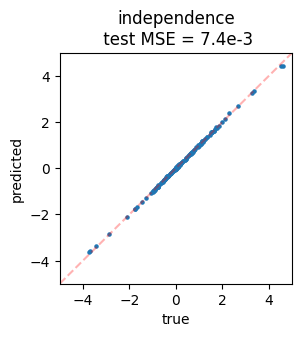

In [4]:
plt.figure(figsize=(3,3))
plt.plot([-6,6],[-6,6],ls="--",color="red", alpha=0.3)
plt.scatter(labels_test.detach().numpy(), pred_test.detach().numpy(), s=5)
plt.xlim(-5,5)
plt.ylim(-5,5)
plt.xlabel("true")
plt.ylabel("predicted")
plt.title("independence\n test MSE = 7.4e-3")
plt.savefig("./fig/independence_compare.png", bbox_inches="tight")

# Superposition try please please please, im cool dw no worries at all, im mentally stable and definitely not panicking haha

In [7]:
import torch
from torch import nn
from torch.nn import functional as F

from typing import Optional

from dataclasses import dataclass, replace
import numpy as np
import einops

from tqdm.notebook import trange

import time
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt

In [23]:
linears = model.get_linear_layers()
W = linears[0].linear.weight.T
# print(W.shape)
score = torch.sum(torch.abs(W), dim=0)
# print(score)
top_index = torch.flip(torch.argsort(score),[0])
features = model.linears[0].linear.weight[top_index].T
# print(W.shape)
# print(W)

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
# print(W_norm.shape)
# print(W_norm)
interference = torch.einsum('fh,gh->fg', W_norm, features)
# print(interference.shape)
interference[torch.arange(4), torch.arange(4)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()

norms = torch.linalg.norm(features, 2, dim=-1).cpu()

x = torch.arange(4)
width = 0.9
fig = go.Figure(go.Bar(x=x.detach().numpy(), 
        y=norms.detach().numpy(),
        marker=dict(
            color=polysemanticity.detach().numpy(),
            cmin=0,
            cmax=1
        ),
        width=width,
        ))
fig.show()

In [30]:
linears = model.get_linear_layers()
W = linears[0].linear.weight.T
n_features = W.shape[0]
n_hidden = W.shape[1]
print(W.shape)
score = torch.sum(torch.abs(W), dim=1)
print(score.shape)
top_index = torch.flip(torch.argsort(score),[0])
# print(top_index)
features = W[top_index]
print(features.shape)

# print(features.shape)
# print(W)

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
print(W_norm.shape)
# print(W_norm)
interference = torch.einsum('fh,gh->fg', W_norm, features)
print(interference.shape)
interference[torch.arange(n_features), torch.arange(n_features)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()
print(polysemanticity.shape)
norms = torch.linalg.norm(features, 2, dim=-1).cpu()

x = torch.arange(n_features)
width = 0.9
fig = go.Figure(go.Bar(x=x.detach().numpy(), 
        y=norms.detach().numpy(),
        marker=dict(
            color=polysemanticity.detach().numpy(),
            cmin=0,
            cmax=1
        ),
        width=width,
        ))
fig.show()

torch.Size([4, 20])
torch.Size([4])
torch.Size([4, 20])
torch.Size([4, 20])
torch.Size([4, 4])
torch.Size([4])


In [31]:
linears = model1.get_linear_layers()
W = linears[0].linear.weight.T
n_features = W.shape[0]
n_hidden = W.shape[1]
print(W.shape)
score = torch.sum(torch.abs(W), dim=1)
print(score.shape)
top_index = torch.flip(torch.argsort(score),[0])
# print(top_index)
features = W[top_index]
print(features.shape)

# print(features.shape)
# print(W)

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
print(W_norm.shape)
# print(W_norm)
interference = torch.einsum('fh,gh->fg', W_norm, features)
print(interference.shape)
interference[torch.arange(n_features), torch.arange(n_features)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()
print(polysemanticity.shape)
norms = torch.linalg.norm(features, 2, dim=-1).cpu()

x = torch.arange(n_features)
width = 0.9
fig = go.Figure(go.Bar(x=x.detach().numpy(), 
        y=norms.detach().numpy(),
        marker=dict(
            color=polysemanticity.detach().numpy(),
            cmin=0,
            cmax=1
        ),
        width=width,
        ))
fig.show()

torch.Size([4, 20])
torch.Size([4])
torch.Size([4, 20])
torch.Size([4, 20])
torch.Size([4, 4])
torch.Size([4])


In [29]:
linears = model1.get_linear_layers()
W = linears[0].linear.weight.T
# print(W.shape)
score = torch.sum(torch.abs(W), dim=0)
# print(score)
top_index = torch.flip(torch.argsort(score),[0])
features = model1.linears[0].linear.weight[top_index].T
# print(W.shape)
# print(W)

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
# print(W_norm.shape)
# print(W_norm)
interference = torch.einsum('fh,gh->fg', W_norm, features)
print(interference.shape)
print(interference)
interference[torch.arange(4), torch.arange(4)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()
print(polysemanticity)
norms = torch.linalg.norm(features, 2, dim=-1).cpu()

# x = torch.arange(4)
# width = 0.9
# fig = go.Figure(go.Bar(x=x.detach().numpy(), 
#         y=norms.detach().numpy(),
#         marker=dict(
#             color=polysemanticity.detach().numpy(),
#             cmin=0,
#             cmax=1
#         ),
#         width=width,
#         ))
# fig.show()

torch.Size([4, 4])
tensor([[2.1262, 0.1273, 2.0043, 0.1139],
        [0.1340, 2.0190, 0.0131, 0.3005],
        [1.9688, 0.0122, 2.1645, 0.0494],
        [0.0684, 0.1714, 0.0302, 3.5404]], grad_fn=<ViewBackward0>)
tensor([2.0116, 0.3293, 1.9695, 0.1870], grad_fn=<LinalgVectorNormBackward0>)


In [27]:
W_norm.shape

torch.Size([4, 20])

In [28]:
features.shape

torch.Size([4, 20])

In [9]:

i = 2
top_k = 20
linears = model.get_linear_layers()
num_linear = len(linears)
if i == 0:
    # input layer
    weights = linears[i].linear.weight
    score = torch.sum(torch.abs(weights), dim=0)
    in_fold = linears[0].in_fold
    #print(score.shape)
    score = torch.sum(score.reshape(in_fold, int(score.shape[0]/in_fold)), dim=0)
elif i == num_linear:
    # output layer
    weights = linears[i-1].linear.weight
    score = torch.sum(torch.abs(weights), dim=1)
else:
    print("here haha")
    weights_in = linears[i-1].linear.weight
    weights_out = linears[i].linear.weight
    score = torch.sum(torch.abs(weights_out), dim=0) + torch.sum(torch.abs(weights_in), dim=1)
print(score.shape)
top_index = torch.flip(torch.argsort(score),[0])[:top_k]
score = score[top_index]

num = score.shape[0]

features = model.linears[1].linear.weight[top_index].T
features.shape

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
interference = torch.einsum('fh,gh->fg', W_norm, features)
interference[torch.arange(20), torch.arange(20)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()

norms = torch.linalg.norm(features, 2, dim=-1).cpu()

WtW = torch.einsum('ih,oh->io', features, features).cpu()
print(polysemanticity.shape)
print(norms)

x = torch.arange(100)
width = 0.9
fig = go.Figure(go.Bar(x=x.detach().numpy(), 
        y=norms.detach().numpy(),
        marker=dict(
            color=polysemanticity.detach().numpy(),
            cmin=0,
            cmax=1
        ),
        width=width,
        ))
fig.show()

here haha
torch.Size([20])
torch.Size([20])
tensor([1.0381e-03, 6.4158e-04, 9.0668e-01, 6.7980e-04, 7.0051e-04, 1.5982e+00,
        9.0011e-04, 8.2511e-01, 8.1573e-04, 1.0652e-03, 9.3034e-04, 9.2194e-04,
        1.0574e-03, 3.3428e+00, 1.0239e-03, 2.9990e+00, 9.5770e-04, 6.9143e-04,
        9.9491e-04, 9.4956e-04], grad_fn=<LinalgVectorNormBackward0>)


In [10]:

i = 2
top_k = 20
linears = model1.get_linear_layers()
num_linear = len(linears)
if i == 0:
    # input layer
    weights = linears[i].linear.weight
    score = torch.sum(torch.abs(weights), dim=0)
    in_fold = linears[0].in_fold
    #print(score.shape)
    score = torch.sum(score.reshape(in_fold, int(score.shape[0]/in_fold)), dim=0)
elif i == num_linear:
    # output layer
    weights = linears[i-1].linear.weight
    score = torch.sum(torch.abs(weights), dim=1)
else:
    print("here haha")
    weights_in = linears[i-1].linear.weight
    weights_out = linears[i].linear.weight
    score = torch.sum(torch.abs(weights_out), dim=0) + torch.sum(torch.abs(weights_in), dim=1)
print(score.shape)
top_index = torch.flip(torch.argsort(score),[0])[:top_k]
score = score[top_index]

num = score.shape[0]

features = model1.linears[1].linear.weight[top_index].T
features.shape

W_norm = features / (1e-5 + torch.linalg.norm(features, 2, dim=-1, keepdim=True))
interference = torch.einsum('fh,gh->fg', W_norm, features)
interference[torch.arange(20), torch.arange(20)] = 0
polysemanticity = torch.linalg.norm(interference, dim=-1).cpu()

norms = torch.linalg.norm(features, 2, dim=-1).cpu()

WtW = torch.einsum('ih,oh->io', features, features).cpu()
print(polysemanticity.shape)
print(norms)

x = torch.arange(100)
width = 0.9
fig = go.Figure(go.Bar(x=x.detach().numpy(), 
        y=norms.detach().numpy(),
        marker=dict(
            color=polysemanticity.detach().numpy(),
            cmin=0,
            cmax=1
        ),
        width=width,
        ))
fig.show()

here haha
torch.Size([20])
torch.Size([20])
tensor([2.5206, 1.4870, 1.8382, 2.3813, 1.4428, 2.4314, 1.3436, 1.7959, 1.3417,
        2.8538, 1.6918, 1.3525, 1.7478, 1.2707, 2.4215, 2.0803, 1.3965, 1.8348,
        1.9941, 2.4920], grad_fn=<LinalgVectorNormBackward0>)


## The feature sharing example. NN takes in $(x_1,x_2,x_3)$ and aims to predict $(x_1^2,x_1^2+x_2^2,x_1^2+x_2^2+x_3^2)$.


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F


# create dataset

seed = 4
np.random.seed(seed)
torch.manual_seed(seed)


def f(data):
    x1 = data[:,[0]]
    x2 = data[:,[1]]
    x3 = data[:,[2]]    
    out = np.transpose(np.array([x1**2, x1**2+x2**2, x1**2+x2**2+x3**2]))
    return out


d_in = 3
d_out = 3

inputs = np.random.rand(100,d_in)*2-1
labels = f(inputs)

inputs = torch.tensor(inputs, dtype=torch.float, requires_grad=True)
labels = torch.tensor(labels, dtype=torch.float, requires_grad=True)

inputs_test = np.random.rand(100,d_in)*2-1
labels_test = f(inputs_test)

inputs_test = torch.tensor(inputs_test, dtype=torch.float, requires_grad=True)
labels_test = torch.tensor(labels_test, dtype=torch.float, requires_grad=True)


width = 20
depth = 3
shp = [d_in, 20, 20, d_out]


model = BioMLP(shp=shp)

# train_type = 1; no L1
# train_type = 2; L1
# train_type = 3: L1 + Local
# train_type = 4: L1 + Swap
# train_type = 5: L1 + Local + Swap
train_type = 5

optimizer = torch.optim.AdamW(model.parameters(), lr=0.002, weight_decay=0.0)
log = 200
lamb = 0 if train_type==1 else 0.001
swap_log = 200 if train_type >= 4 else float('inf')
weight_factor = 1. if train_type == 3 or train_type == 5 else 0.
plot_log = 50
steps = 20000
 
for step in range(steps):
    
    if step == int(steps/4):
        lamb *= 10
    
    if step == int(3*steps/4):
        lamb *= 0.1
    
    optimizer.zero_grad()
    pred  = model(inputs)
    loss = torch.mean((pred-labels)**2)
    pred_test  = model(inputs_test)
    loss_test = torch.mean((pred_test-labels_test)**2)
    
    # do not penalize bias at first (this makes the weight graph look better)
    if step < int(3*steps/4):
        reg = model.get_cc(bias_penalize=False, weight_factor=weight_factor)
    else:
        reg = model.get_cc(bias_penalize=True, weight_factor=weight_factor)
    #reg = model.get_cc(bias_penalize=True)
    total_loss = loss + lamb*reg
    total_loss.backward()
    optimizer.step()
    
    if step % log == 0:
        print("step = %d | total loss: %.2e | train loss: %.2e | test loss %.2e | reg: %.2e "%(step, total_loss.detach().numpy(), loss.detach().numpy(), loss_test.detach().numpy(), reg.detach().numpy()))
    
    if (step+1) % swap_log == 0:
        model.relocate()

    if step % plot_log == 0:
        model.plot()
        formulas = [r"$x_1^2$", r"$x_1^2+x_2^2$", r"$x_1^2+x_2^2+x_3^2$"]
        fontsize = 12
        for j in range(shp[0]):
            plt.text(1/(2*shp[1])+7*j/shp[1]+0.1, -0.04, "$x_{}$".format(model.in_perm[j].long()+1), fontsize=fontsize)

        for j in range(shp[-1]):
            plt.text(1/(2*shp[0])+j/shp[0]-0.12, 0.1*(len(shp)-1)+0.02, formulas[model.out_perm[j].long()], fontsize=fontsize)

        #plt.savefig("./video_figs/sf_fs/{0:05d}.png".format(step))
        plt.show()
    

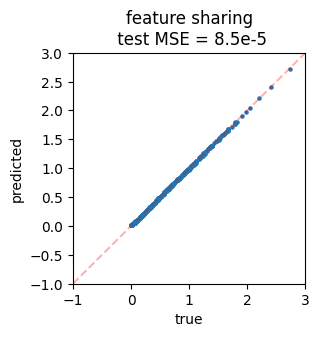

In [6]:
plt.figure(figsize=(3,3))
plt.plot([-6,6],[-6,6],ls="--",color="red", alpha=0.3)
plt.scatter(labels_test.detach().numpy(), pred_test.detach().numpy(), s=5)
plt.xlim(-1,3)
plt.ylim(-1,3)
plt.xlabel("true")
plt.ylabel("predicted")
plt.title("feature sharing\n test MSE = 8.5e-5")
plt.savefig("./fig/feature_sharing_compare.png", bbox_inches="tight")

## The independence example. NN takes in $(x_1,x_2,x_3,x_4)$ and aims to predict $\sqrt{(x_1-x_2)^2+(x_3-x_4)}$.

step = 0 | total loss: 1.78e+00 | train loss: 1.72e+00 | test loss 1.91e+00 | reg: 6.72e+01 


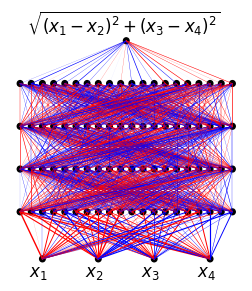

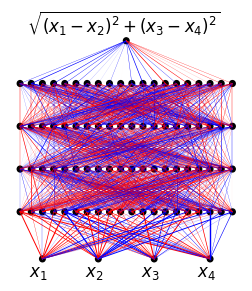

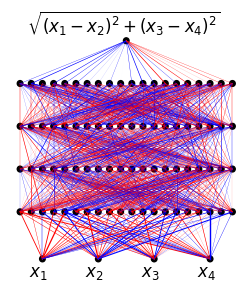

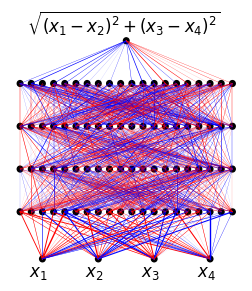

step = 200 | total loss: 1.47e-01 | train loss: 9.66e-02 | test loss 1.66e-01 | reg: 5.05e+01 


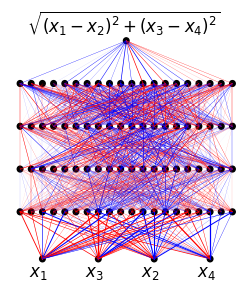

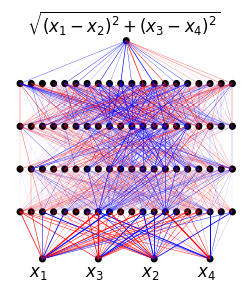

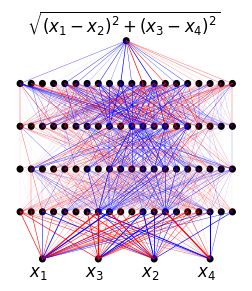

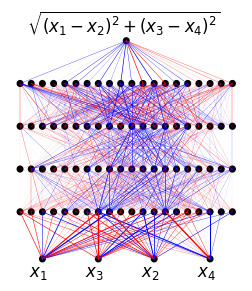

step = 400 | total loss: 5.21e-02 | train loss: 1.99e-02 | test loss 2.76e-02 | reg: 3.23e+01 


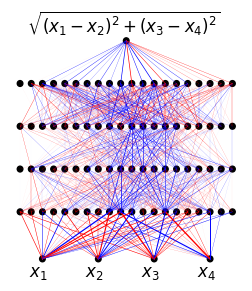

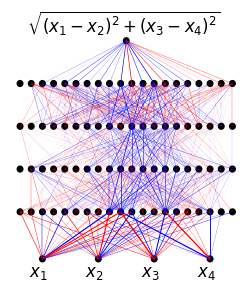

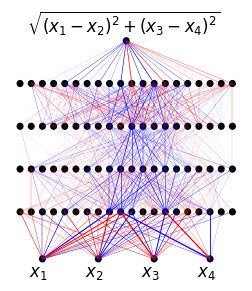

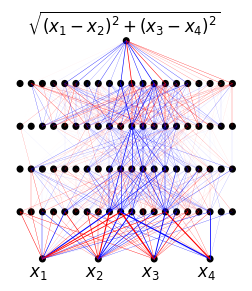

step = 600 | total loss: 3.20e-02 | train loss: 1.05e-02 | test loss 1.28e-02 | reg: 2.15e+01 


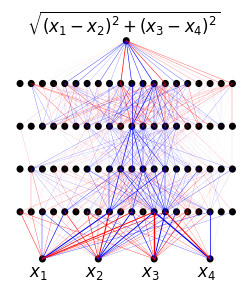

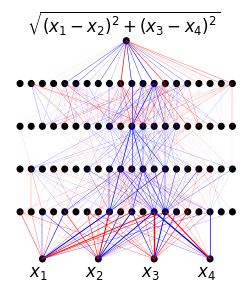

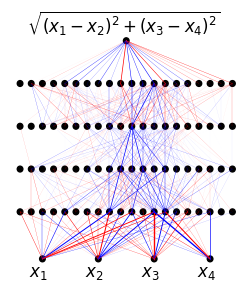

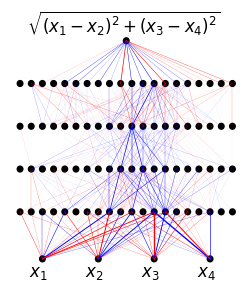

step = 800 | total loss: 2.14e-02 | train loss: 5.29e-03 | test loss 5.55e-03 | reg: 1.61e+01 


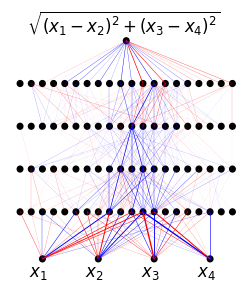

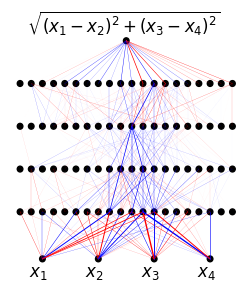

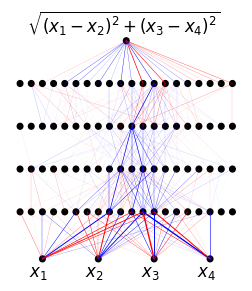

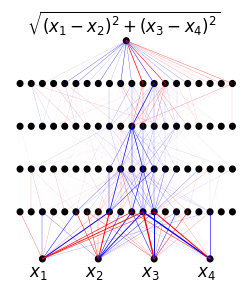

step = 1000 | total loss: 1.56e-02 | train loss: 2.64e-03 | test loss 2.12e-03 | reg: 1.30e+01 


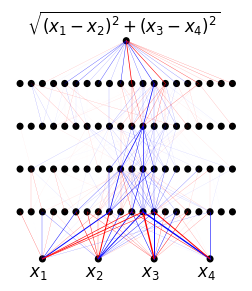

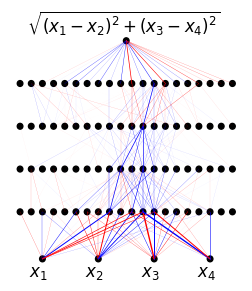

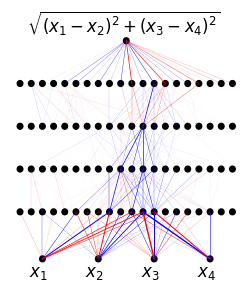

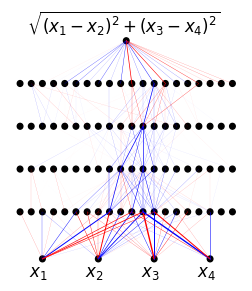

step = 1200 | total loss: 1.27e-02 | train loss: 1.67e-03 | test loss 1.17e-03 | reg: 1.10e+01 


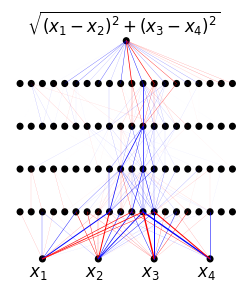

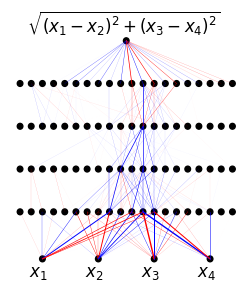

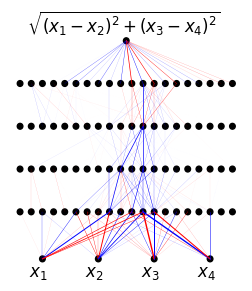

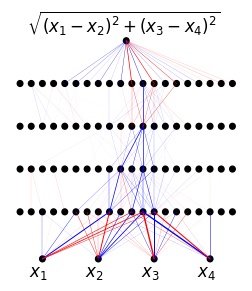

step = 1400 | total loss: 1.07e-02 | train loss: 1.20e-03 | test loss 9.40e-04 | reg: 9.55e+00 


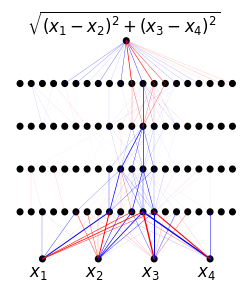

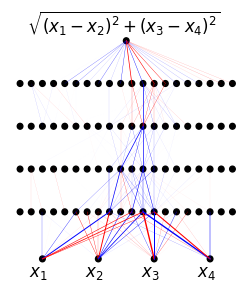

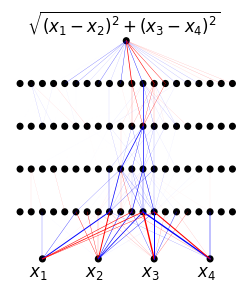

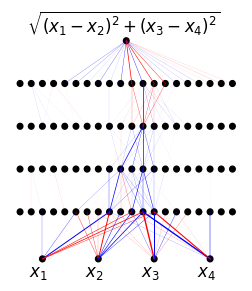

step = 1600 | total loss: 9.45e-03 | train loss: 9.75e-04 | test loss 1.01e-03 | reg: 8.48e+00 


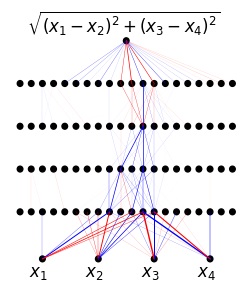

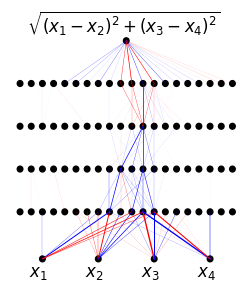

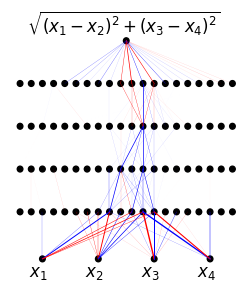

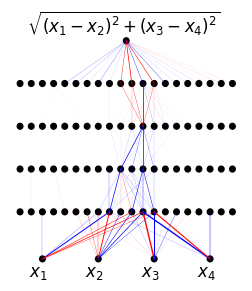

step = 1800 | total loss: 8.56e-03 | train loss: 8.25e-04 | test loss 1.19e-03 | reg: 7.73e+00 


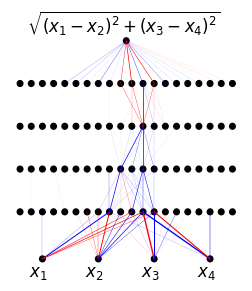

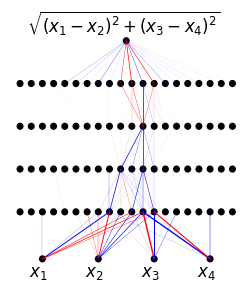

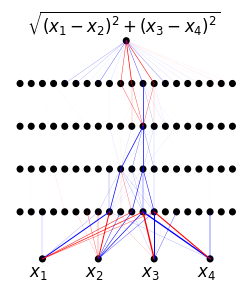

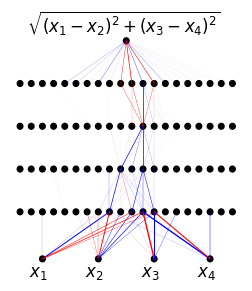

step = 2000 | total loss: 7.90e-03 | train loss: 7.49e-04 | test loss 1.37e-03 | reg: 7.15e+00 


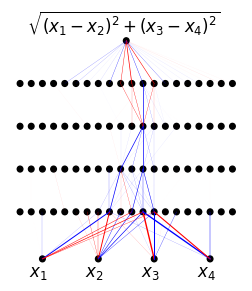

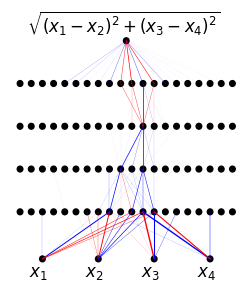

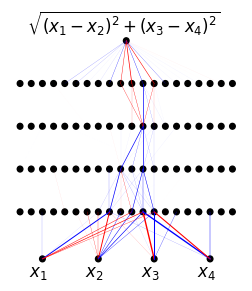

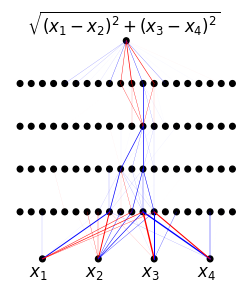

step = 2200 | total loss: 7.37e-03 | train loss: 7.20e-04 | test loss 1.50e-03 | reg: 6.65e+00 


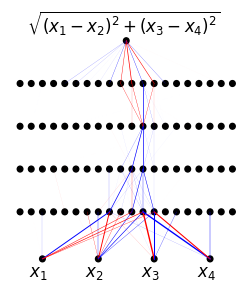

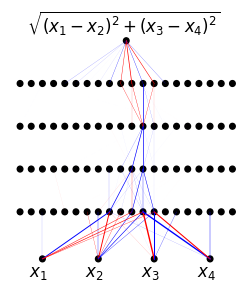

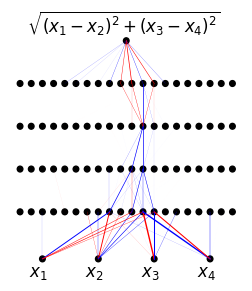

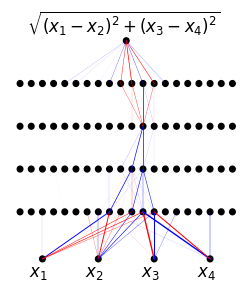

step = 2400 | total loss: 6.92e-03 | train loss: 6.96e-04 | test loss 1.61e-03 | reg: 6.22e+00 


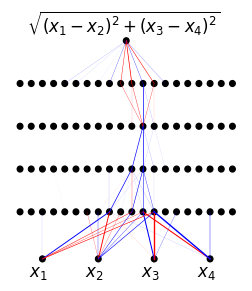

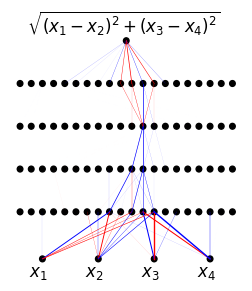

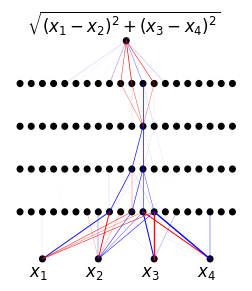

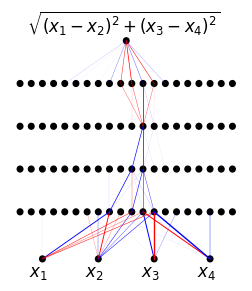

step = 2600 | total loss: 6.49e-03 | train loss: 6.89e-04 | test loss 1.62e-03 | reg: 5.80e+00 


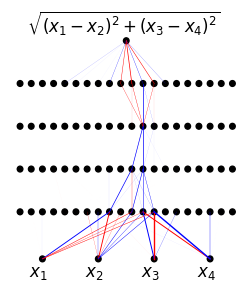

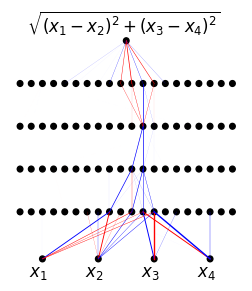

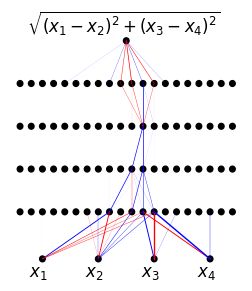

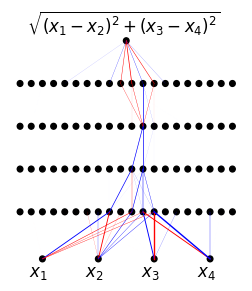

step = 2800 | total loss: 6.15e-03 | train loss: 6.78e-04 | test loss 1.44e-03 | reg: 5.47e+00 


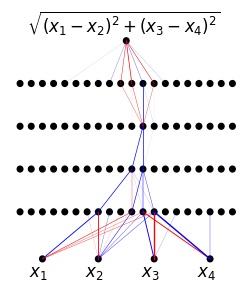

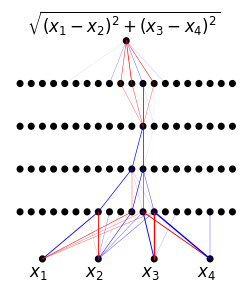

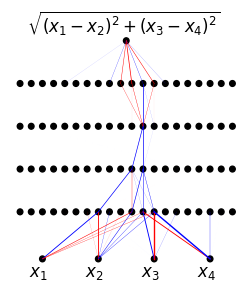

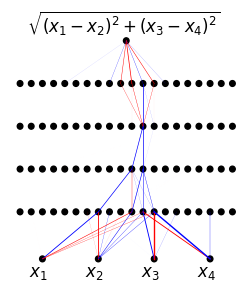

step = 3000 | total loss: 5.87e-03 | train loss: 6.68e-04 | test loss 1.28e-03 | reg: 5.21e+00 


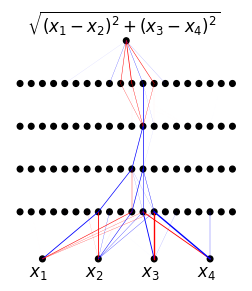

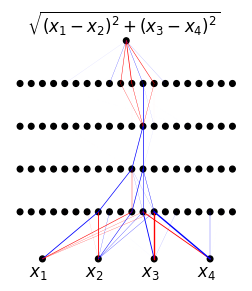

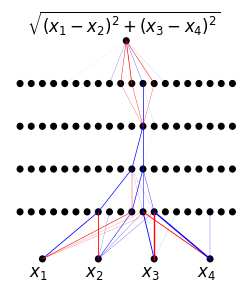

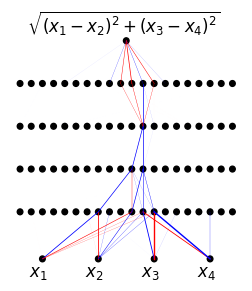

step = 3200 | total loss: 5.63e-03 | train loss: 6.81e-04 | test loss 1.22e-03 | reg: 4.95e+00 


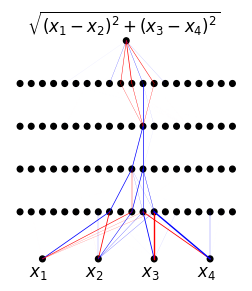

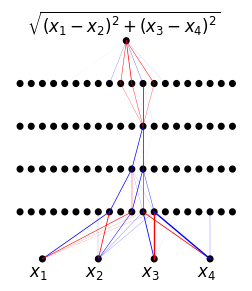

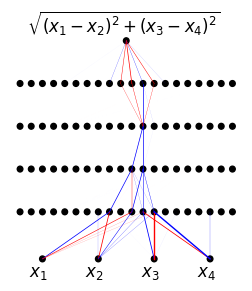

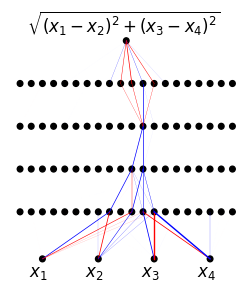

step = 3400 | total loss: 5.41e-03 | train loss: 6.80e-04 | test loss 1.18e-03 | reg: 4.73e+00 


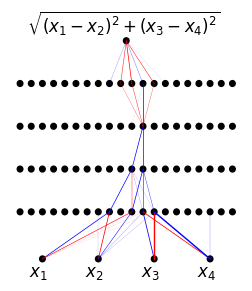

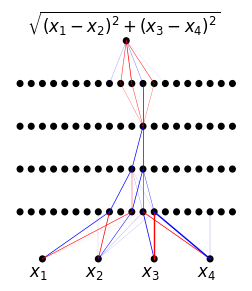

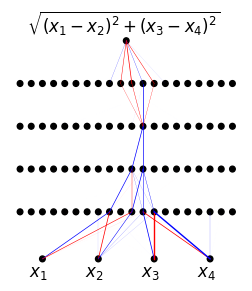

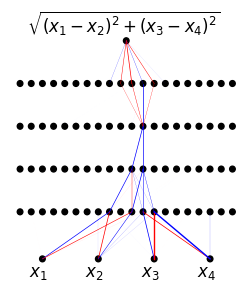

step = 3600 | total loss: 5.20e-03 | train loss: 6.43e-04 | test loss 1.11e-03 | reg: 4.56e+00 


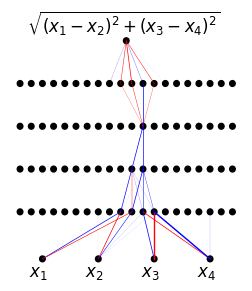

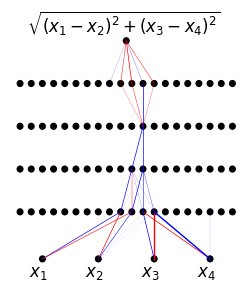

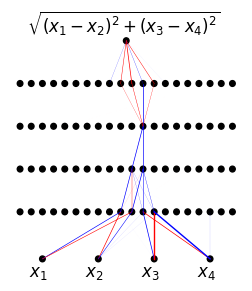

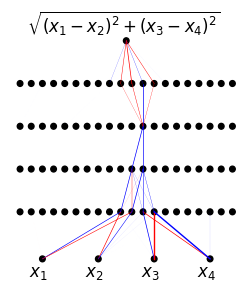

step = 3800 | total loss: 5.05e-03 | train loss: 5.71e-04 | test loss 9.99e-04 | reg: 4.48e+00 


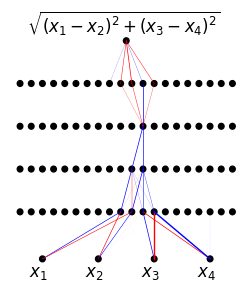

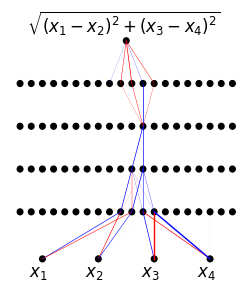

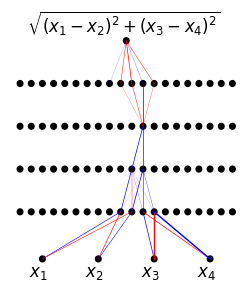

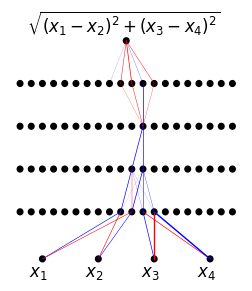

step = 4000 | total loss: 4.96e-03 | train loss: 5.12e-04 | test loss 8.53e-04 | reg: 4.45e+00 


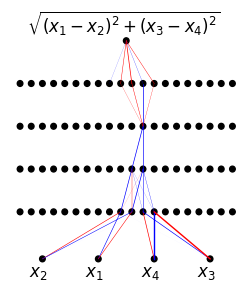

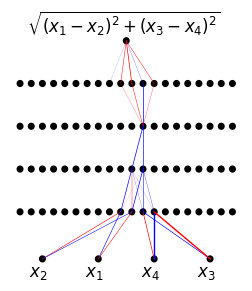

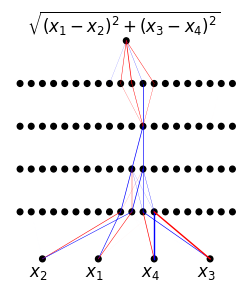

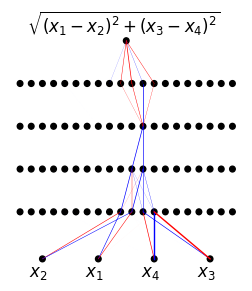

step = 4200 | total loss: 4.89e-03 | train loss: 4.69e-04 | test loss 8.04e-04 | reg: 4.42e+00 


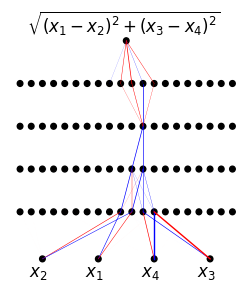

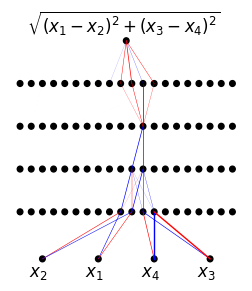

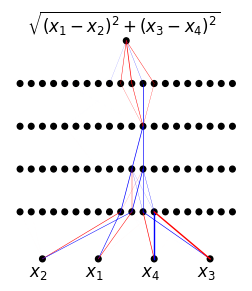

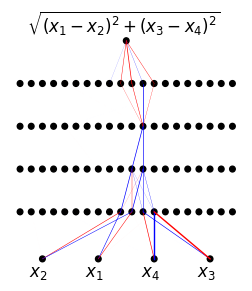

step = 4400 | total loss: 4.83e-03 | train loss: 4.36e-04 | test loss 7.48e-04 | reg: 4.40e+00 


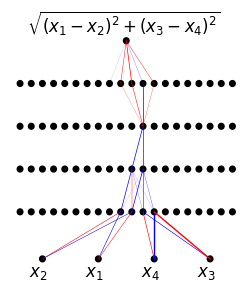

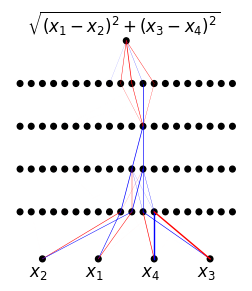

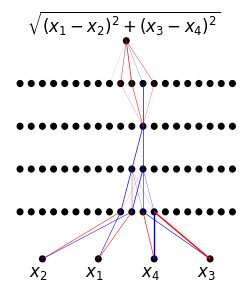

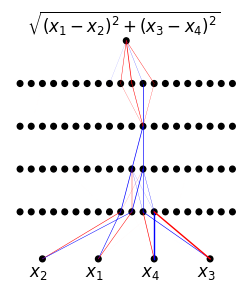

step = 4600 | total loss: 4.78e-03 | train loss: 4.09e-04 | test loss 7.15e-04 | reg: 4.37e+00 


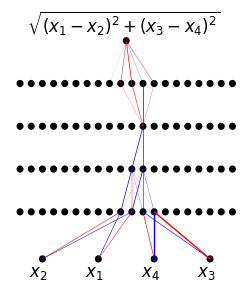

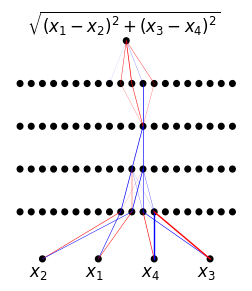

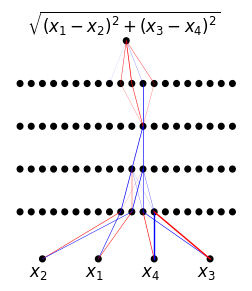

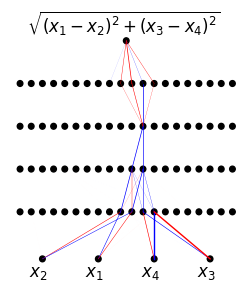

step = 4800 | total loss: 4.71e-03 | train loss: 3.78e-04 | test loss 6.53e-04 | reg: 4.33e+00 


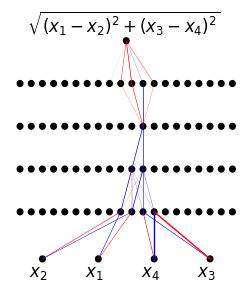

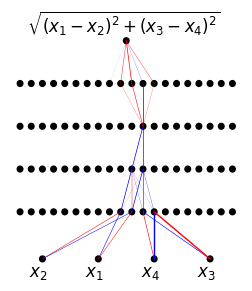

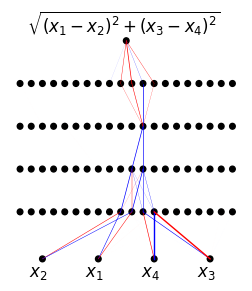

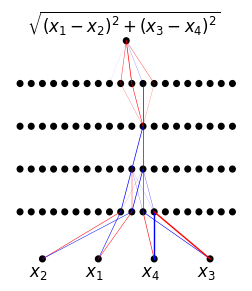

step = 5000 | total loss: 1.33e-02 | train loss: 3.65e-04 | test loss 6.65e-04 | reg: 4.30e+00 


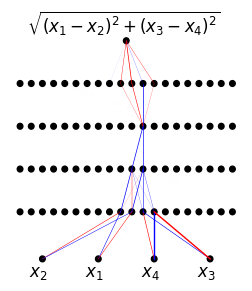

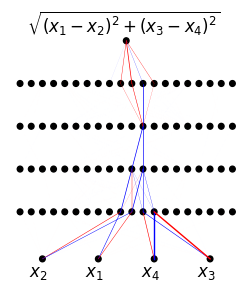

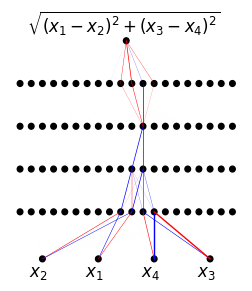

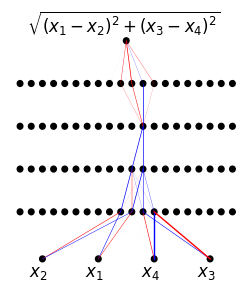

step = 5200 | total loss: 1.28e-02 | train loss: 7.83e-04 | test loss 8.01e-04 | reg: 4.00e+00 


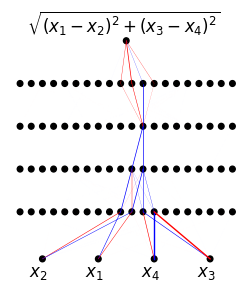

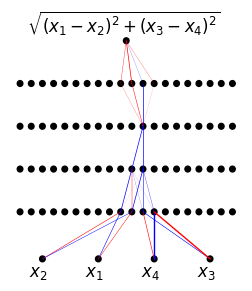

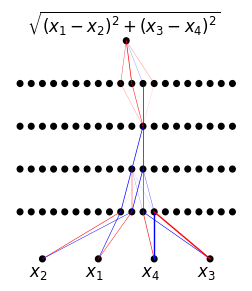

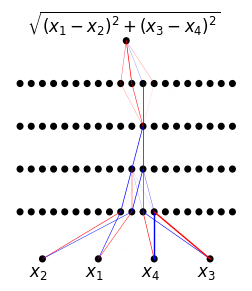

step = 5400 | total loss: 1.23e-02 | train loss: 8.32e-04 | test loss 9.16e-04 | reg: 3.83e+00 


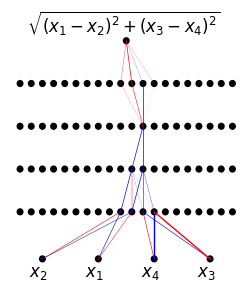

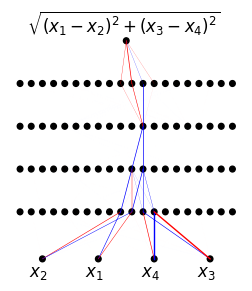

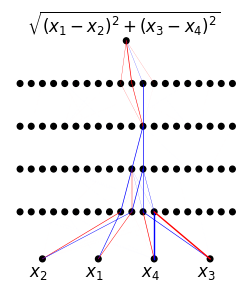

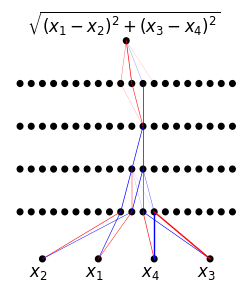

step = 5600 | total loss: 1.19e-02 | train loss: 9.10e-04 | test loss 1.07e-03 | reg: 3.67e+00 


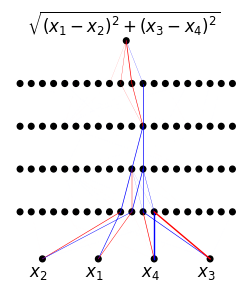

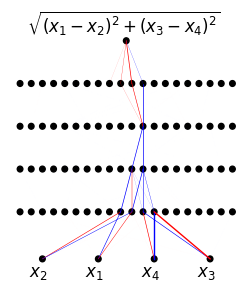

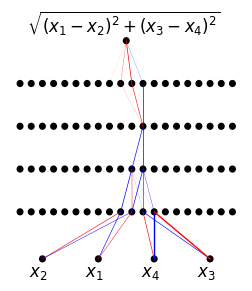

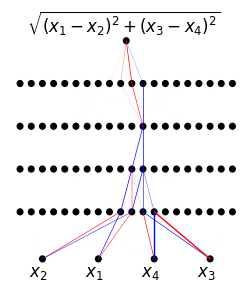

step = 5800 | total loss: 1.17e-02 | train loss: 9.60e-04 | test loss 1.11e-03 | reg: 3.57e+00 


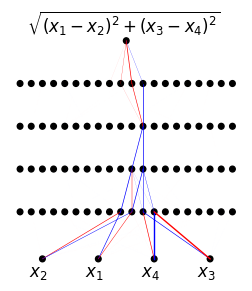

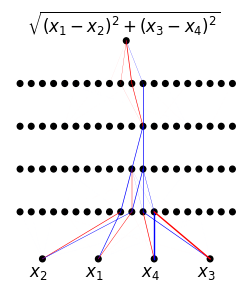

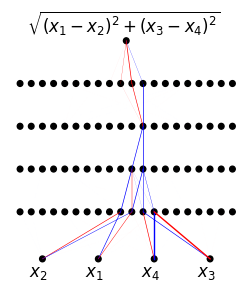

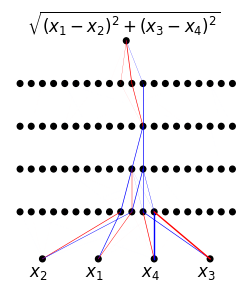

step = 6000 | total loss: 1.15e-02 | train loss: 1.01e-03 | test loss 1.17e-03 | reg: 3.49e+00 


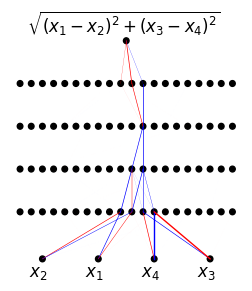

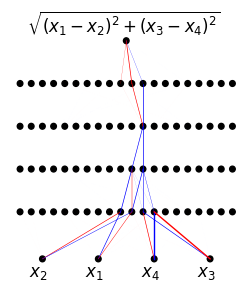

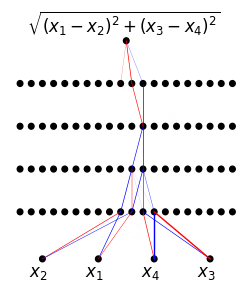

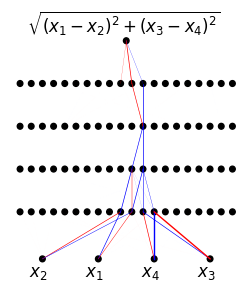

step = 6200 | total loss: 1.13e-02 | train loss: 1.03e-03 | test loss 1.21e-03 | reg: 3.43e+00 


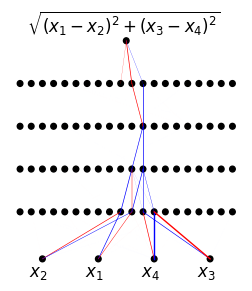

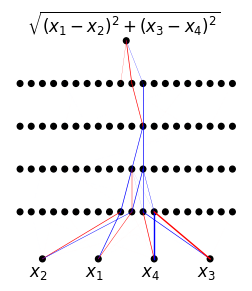

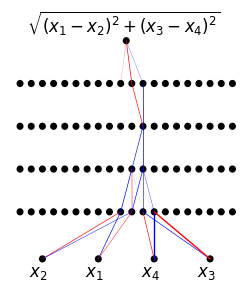

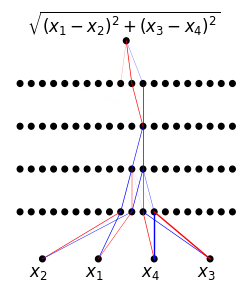

step = 6400 | total loss: 1.12e-02 | train loss: 1.04e-03 | test loss 1.24e-03 | reg: 3.40e+00 


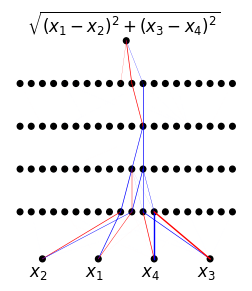

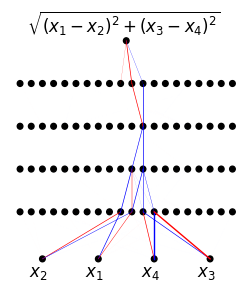

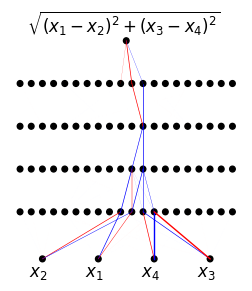

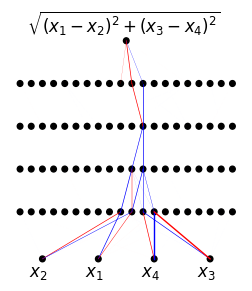

step = 6600 | total loss: 1.12e-02 | train loss: 1.05e-03 | test loss 1.26e-03 | reg: 3.38e+00 


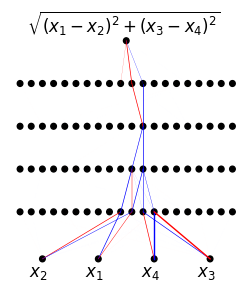

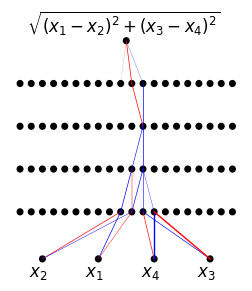

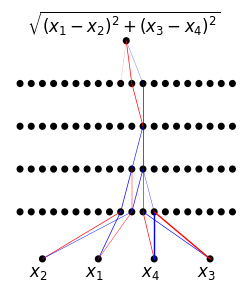

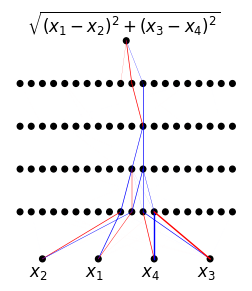

step = 6800 | total loss: 1.11e-02 | train loss: 1.06e-03 | test loss 1.27e-03 | reg: 3.36e+00 


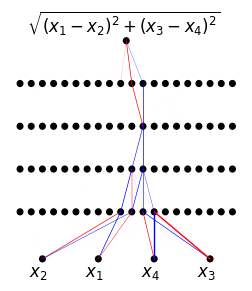

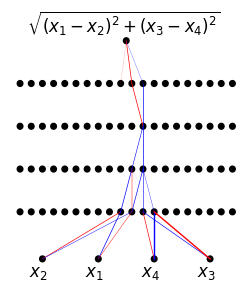

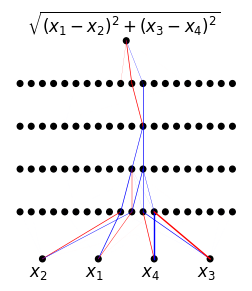

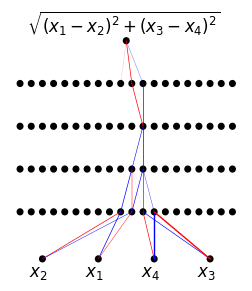

step = 7000 | total loss: 1.11e-02 | train loss: 1.06e-03 | test loss 1.28e-03 | reg: 3.34e+00 


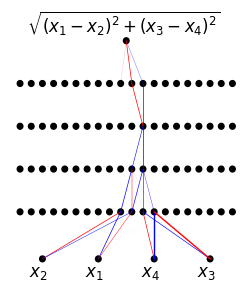

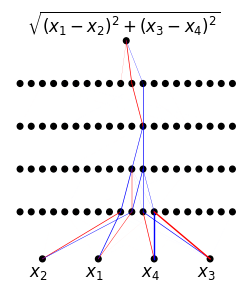

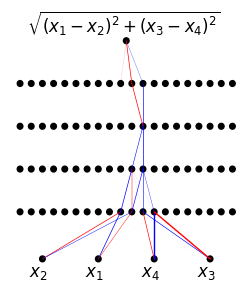

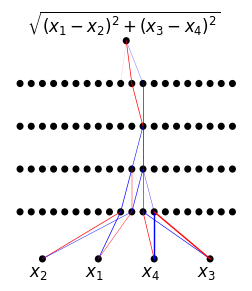

step = 7200 | total loss: 1.11e-02 | train loss: 1.09e-03 | test loss 1.28e-03 | reg: 3.32e+00 


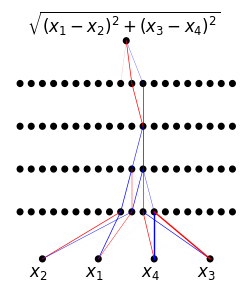

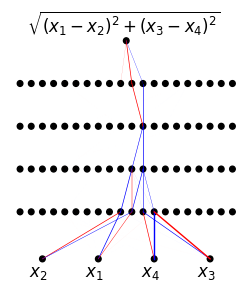

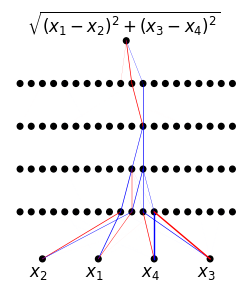

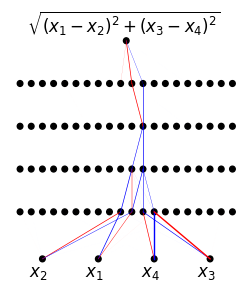

step = 7400 | total loss: 1.10e-02 | train loss: 1.07e-03 | test loss 1.29e-03 | reg: 3.30e+00 


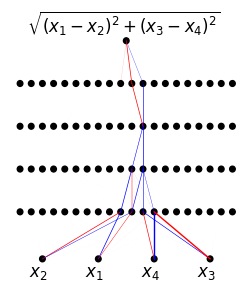

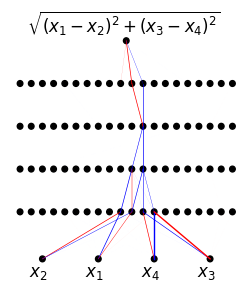

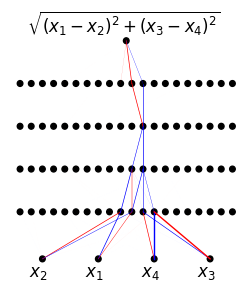

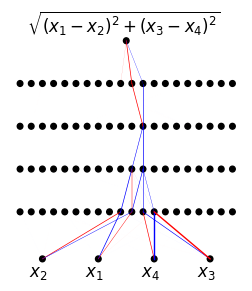

step = 7600 | total loss: 1.09e-02 | train loss: 1.08e-03 | test loss 1.29e-03 | reg: 3.29e+00 


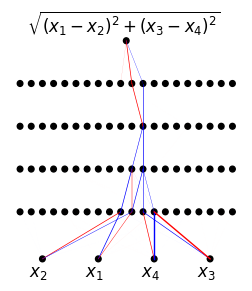

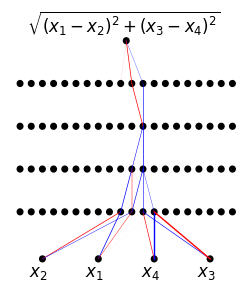

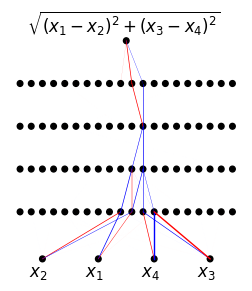

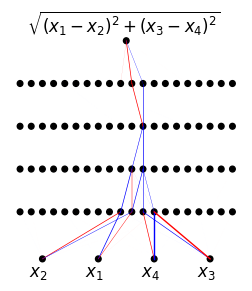

step = 7800 | total loss: 1.09e-02 | train loss: 1.08e-03 | test loss 1.32e-03 | reg: 3.28e+00 


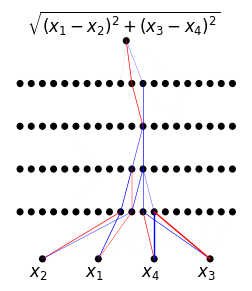

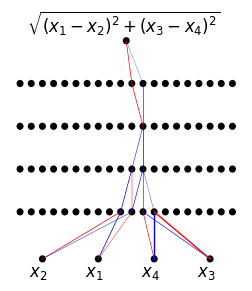

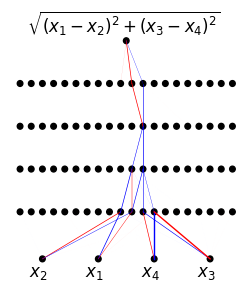

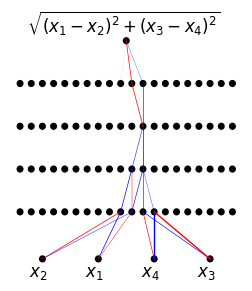

step = 8000 | total loss: 1.09e-02 | train loss: 1.08e-03 | test loss 1.31e-03 | reg: 3.26e+00 


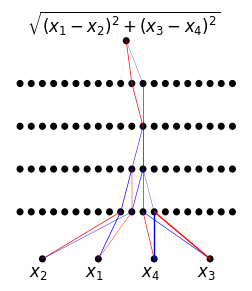

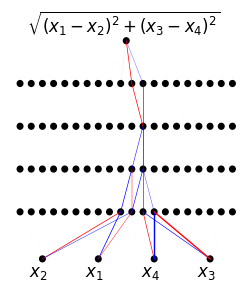

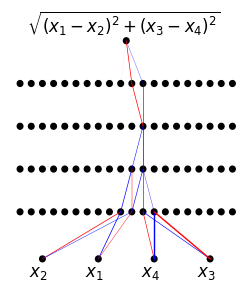

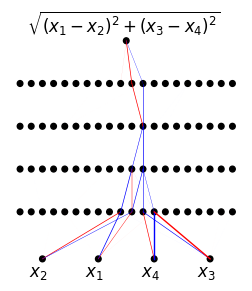

step = 8200 | total loss: 1.08e-02 | train loss: 1.08e-03 | test loss 1.34e-03 | reg: 3.25e+00 


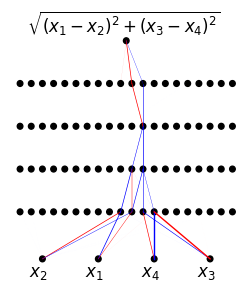

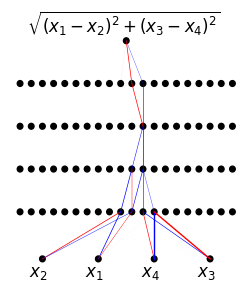

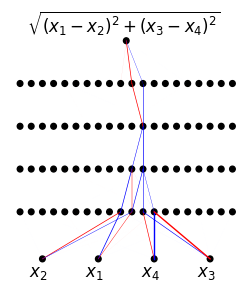

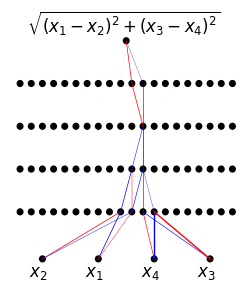

step = 8400 | total loss: 1.08e-02 | train loss: 1.10e-03 | test loss 1.32e-03 | reg: 3.24e+00 


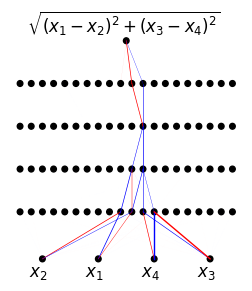

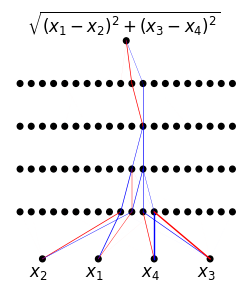

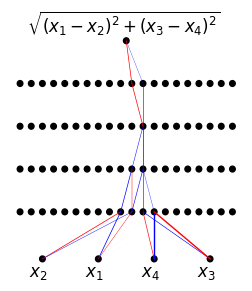

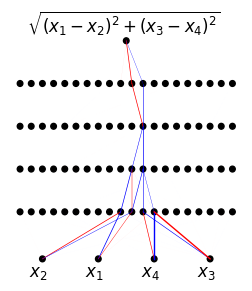

step = 8600 | total loss: 1.08e-02 | train loss: 1.08e-03 | test loss 1.36e-03 | reg: 3.23e+00 


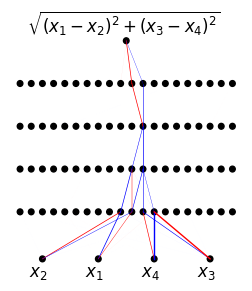

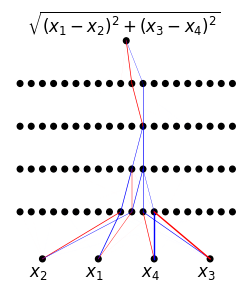

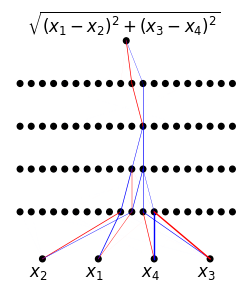

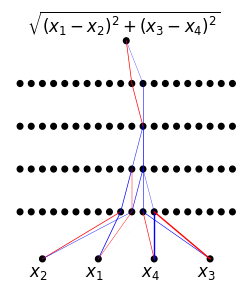

step = 8800 | total loss: 1.08e-02 | train loss: 1.08e-03 | test loss 1.33e-03 | reg: 3.23e+00 


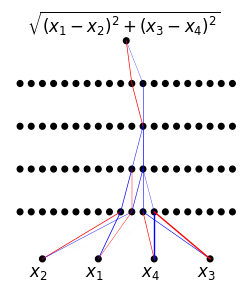

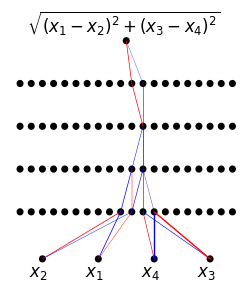

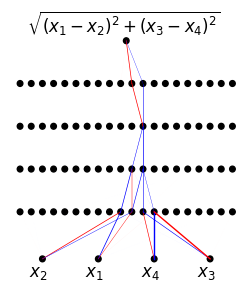

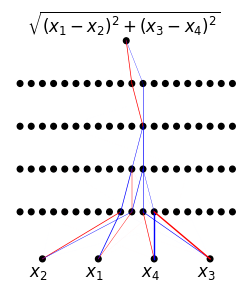

step = 9000 | total loss: 1.07e-02 | train loss: 1.08e-03 | test loss 1.34e-03 | reg: 3.22e+00 


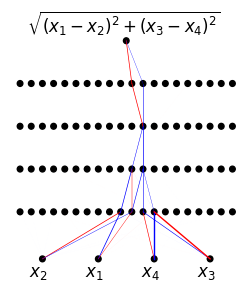

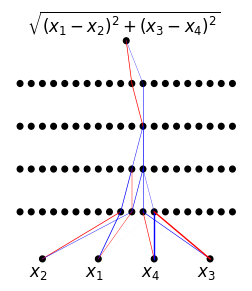

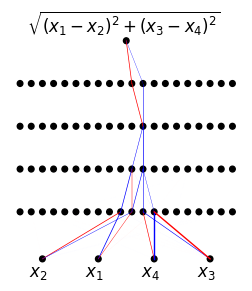

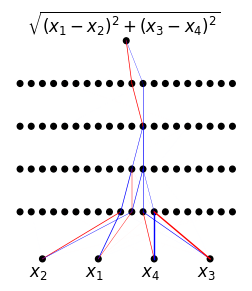

step = 9200 | total loss: 1.07e-02 | train loss: 1.07e-03 | test loss 1.30e-03 | reg: 3.22e+00 


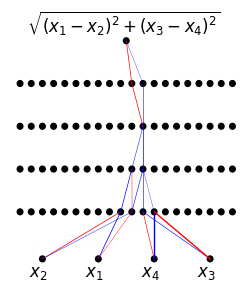

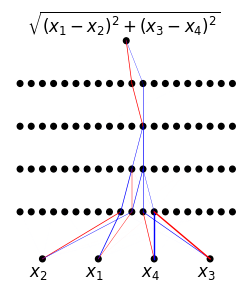

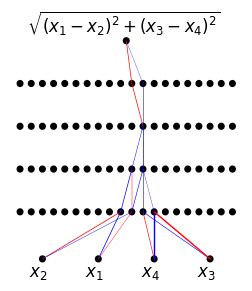

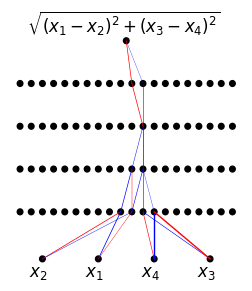

step = 9400 | total loss: 1.07e-02 | train loss: 1.08e-03 | test loss 1.35e-03 | reg: 3.21e+00 


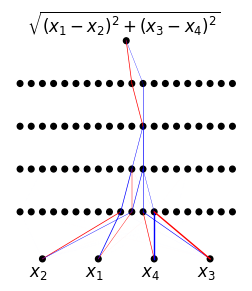

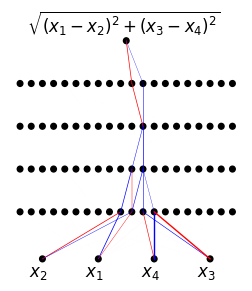

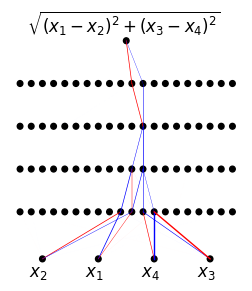

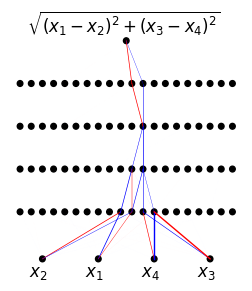

step = 9600 | total loss: 1.07e-02 | train loss: 1.06e-03 | test loss 1.29e-03 | reg: 3.21e+00 


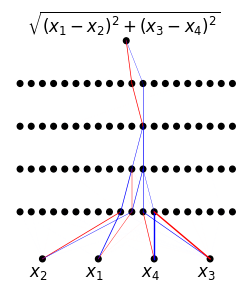

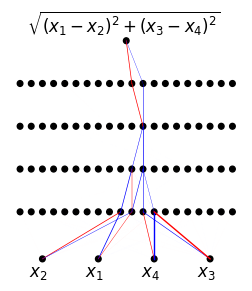

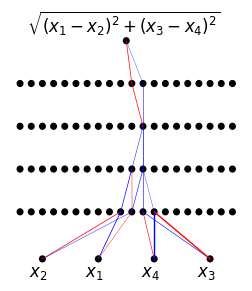

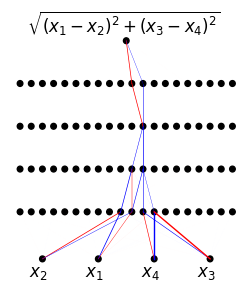

step = 9800 | total loss: 1.07e-02 | train loss: 1.06e-03 | test loss 1.31e-03 | reg: 3.20e+00 


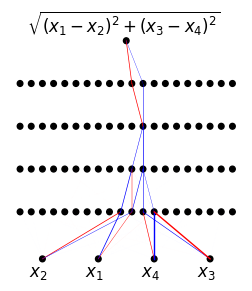

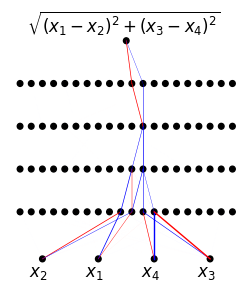

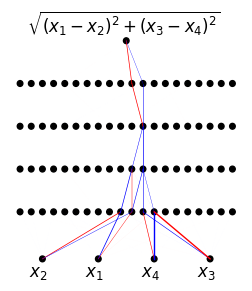

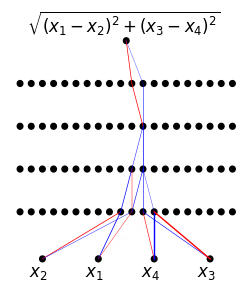

step = 10000 | total loss: 1.07e-02 | train loss: 1.06e-03 | test loss 1.31e-03 | reg: 3.20e+00 


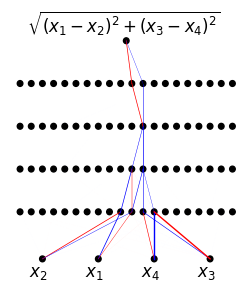

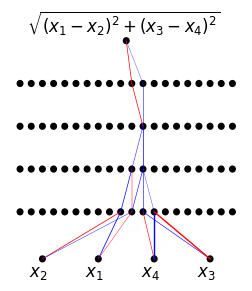

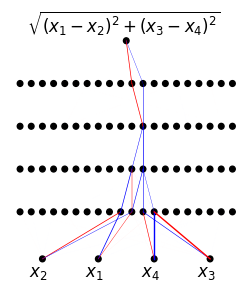

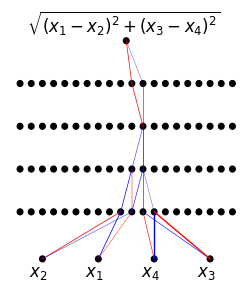

step = 10200 | total loss: 1.06e-02 | train loss: 1.06e-03 | test loss 1.28e-03 | reg: 3.19e+00 


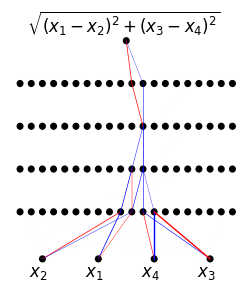

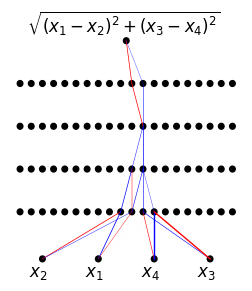

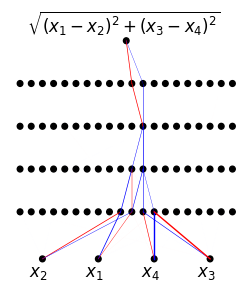

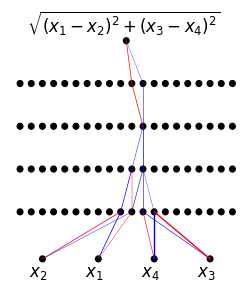

step = 10400 | total loss: 1.06e-02 | train loss: 1.06e-03 | test loss 1.31e-03 | reg: 3.19e+00 


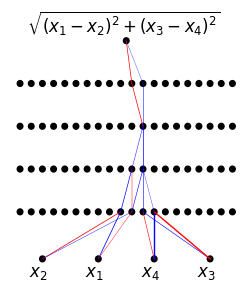

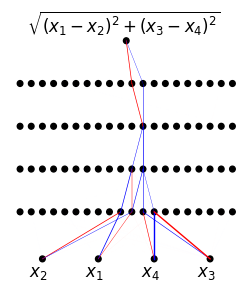

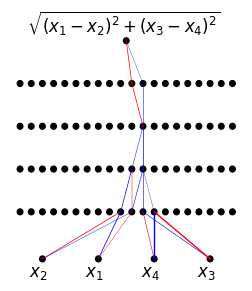

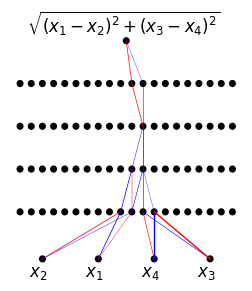

step = 10600 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.29e-03 | reg: 3.18e+00 


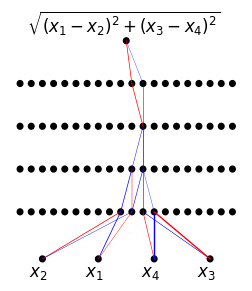

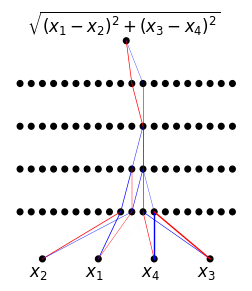

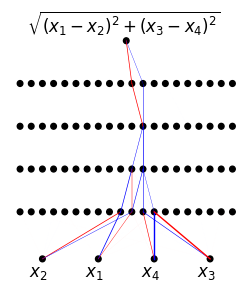

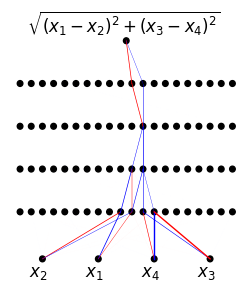

step = 10800 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.28e-03 | reg: 3.18e+00 


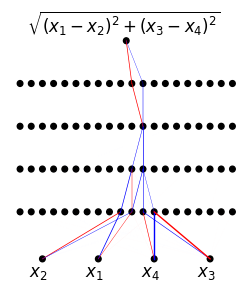

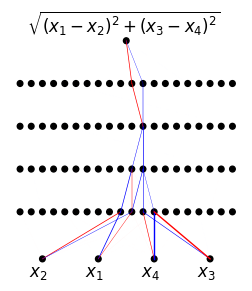

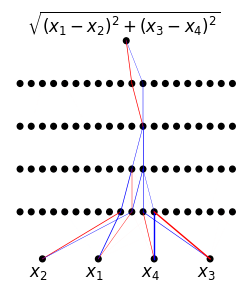

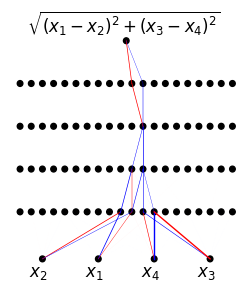

step = 11000 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.30e-03 | reg: 3.17e+00 


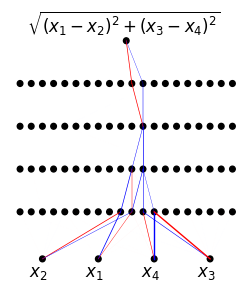

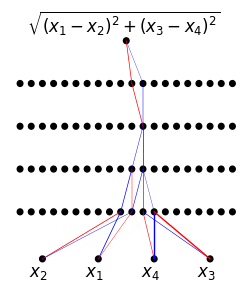

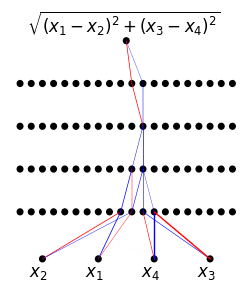

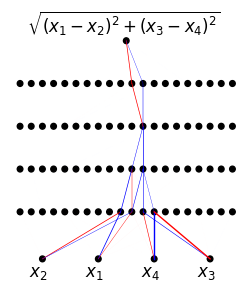

step = 11200 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.29e-03 | reg: 3.17e+00 


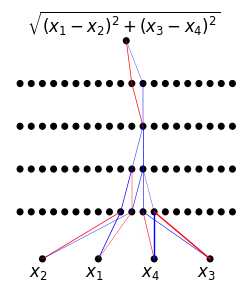

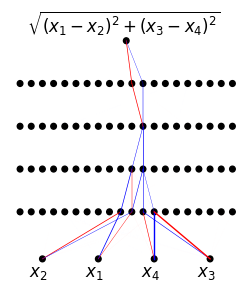

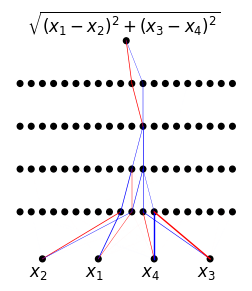

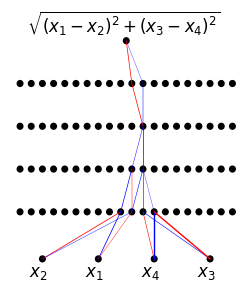

step = 11400 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.26e-03 | reg: 3.17e+00 


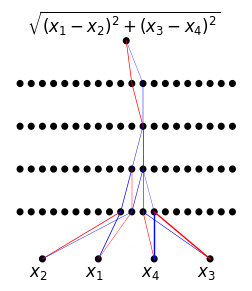

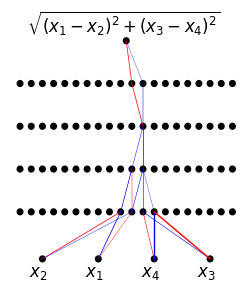

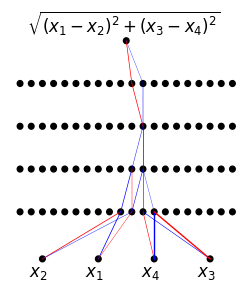

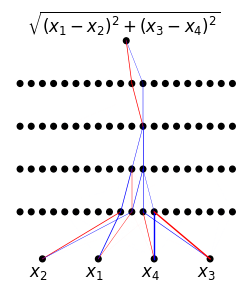

step = 11600 | total loss: 1.06e-02 | train loss: 1.05e-03 | test loss 1.30e-03 | reg: 3.17e+00 


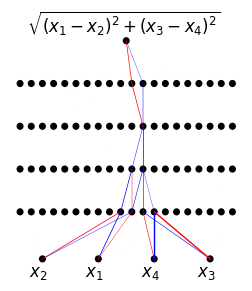

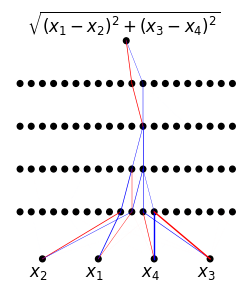

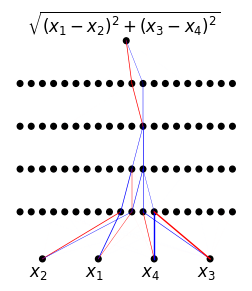

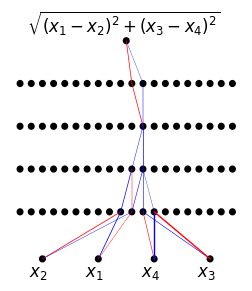

step = 11800 | total loss: 1.05e-02 | train loss: 1.06e-03 | test loss 1.32e-03 | reg: 3.16e+00 


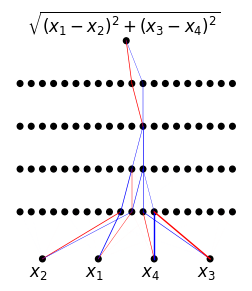

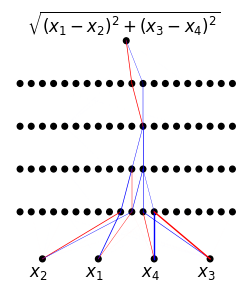

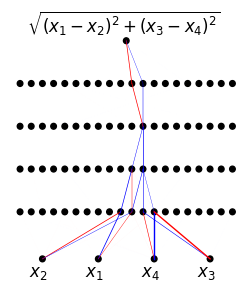

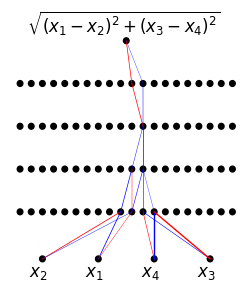

step = 12000 | total loss: 1.05e-02 | train loss: 1.04e-03 | test loss 1.26e-03 | reg: 3.16e+00 


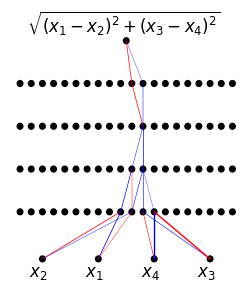

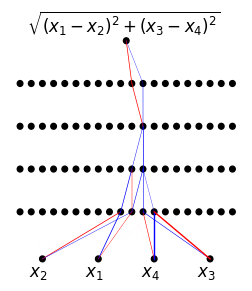

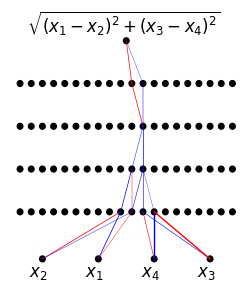

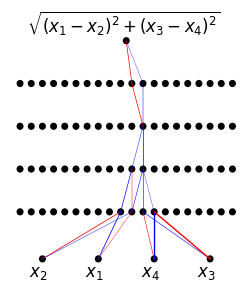

step = 12200 | total loss: 1.05e-02 | train loss: 1.04e-03 | test loss 1.26e-03 | reg: 3.16e+00 


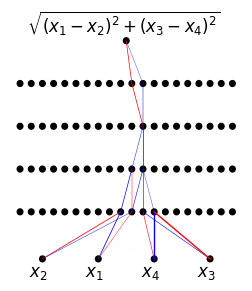

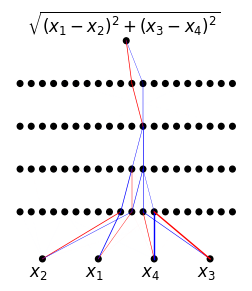

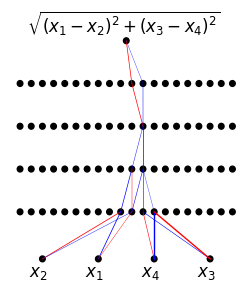

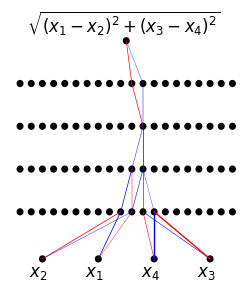

step = 12400 | total loss: 1.05e-02 | train loss: 1.04e-03 | test loss 1.26e-03 | reg: 3.16e+00 


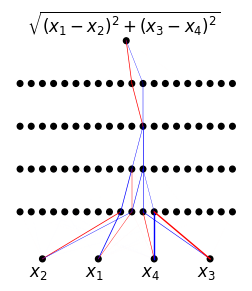

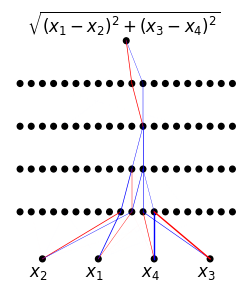

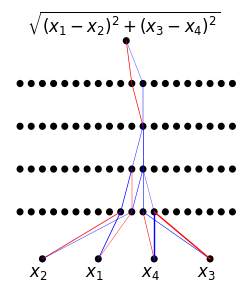

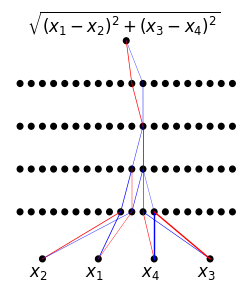

step = 12600 | total loss: 1.05e-02 | train loss: 1.05e-03 | test loss 1.29e-03 | reg: 3.16e+00 


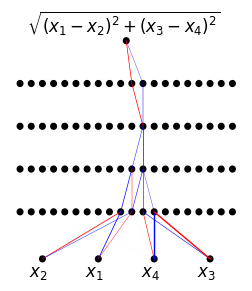

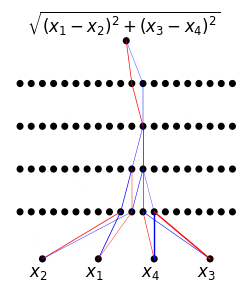

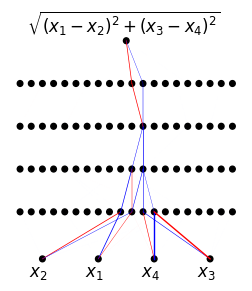

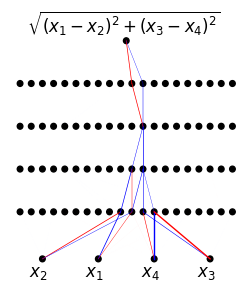

step = 12800 | total loss: 1.05e-02 | train loss: 1.04e-03 | test loss 1.28e-03 | reg: 3.15e+00 


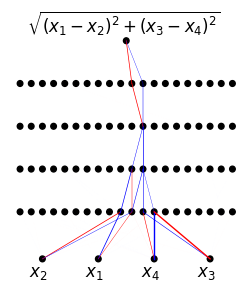

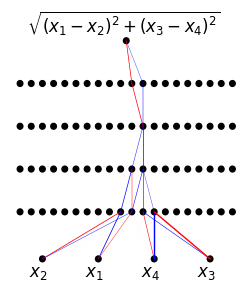

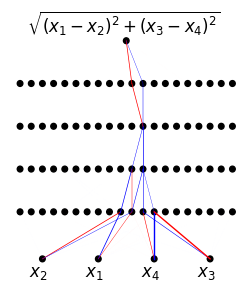

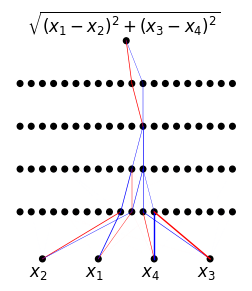

step = 13000 | total loss: 1.05e-02 | train loss: 1.03e-03 | test loss 1.25e-03 | reg: 3.15e+00 


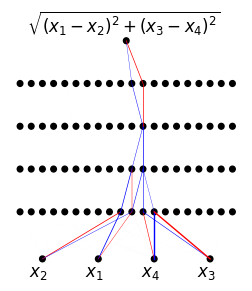

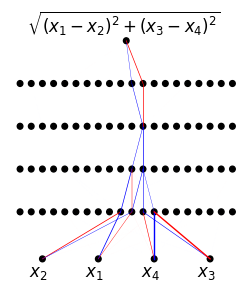

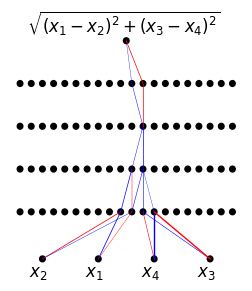

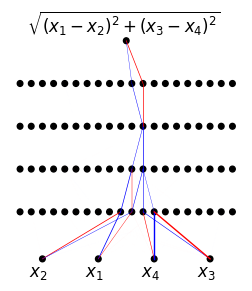

step = 13200 | total loss: 1.05e-02 | train loss: 1.03e-03 | test loss 1.24e-03 | reg: 3.14e+00 


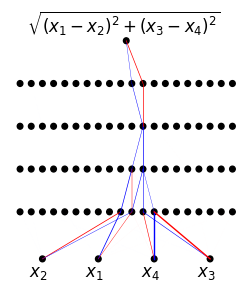

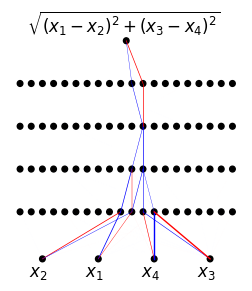

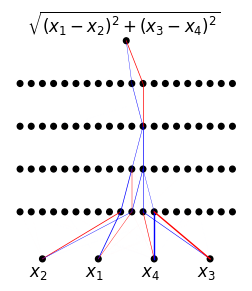

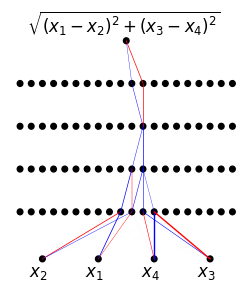

step = 13400 | total loss: 1.05e-02 | train loss: 1.03e-03 | test loss 1.24e-03 | reg: 3.14e+00 


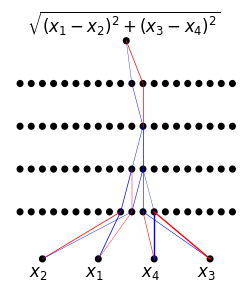

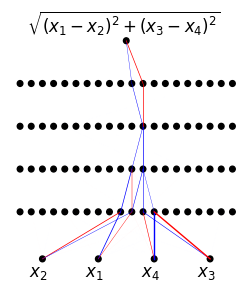

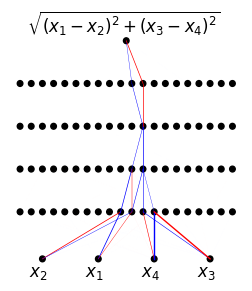

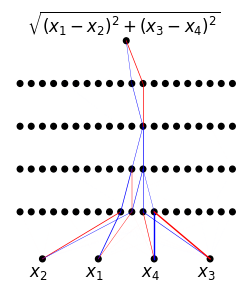

step = 13600 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.23e-03 | reg: 3.14e+00 


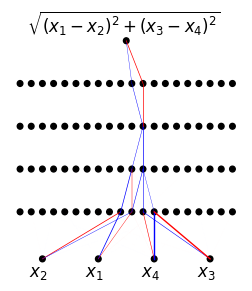

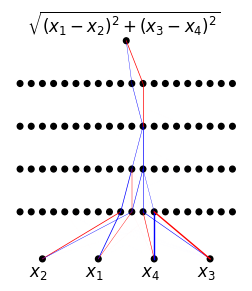

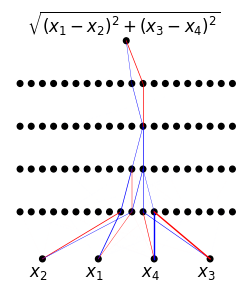

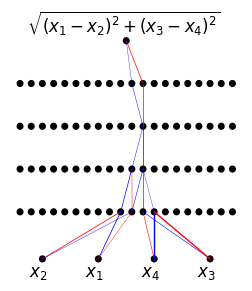

step = 13800 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.24e-03 | reg: 3.14e+00 


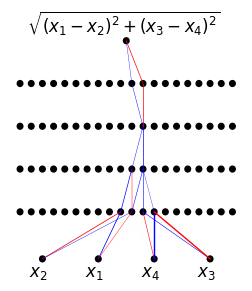

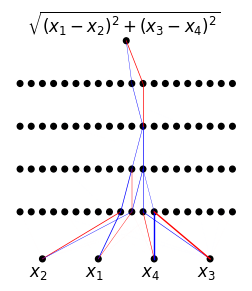

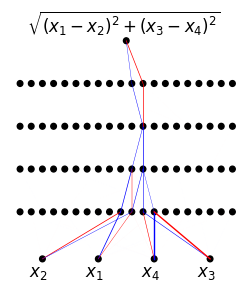

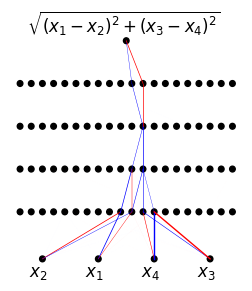

step = 14000 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.25e-03 | reg: 3.13e+00 


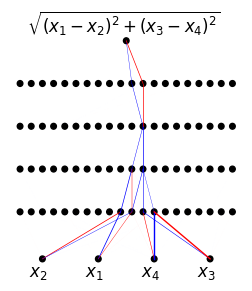

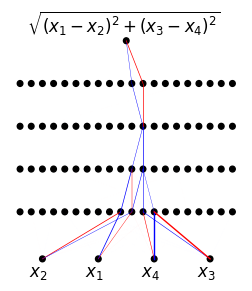

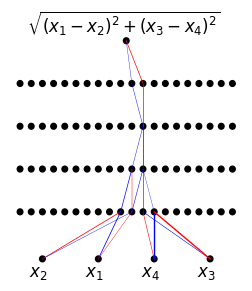

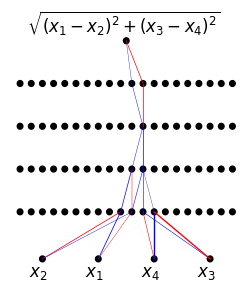

step = 14200 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.27e-03 | reg: 3.13e+00 


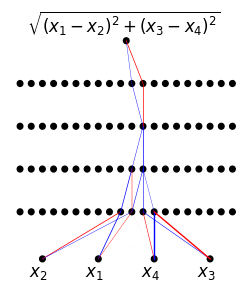

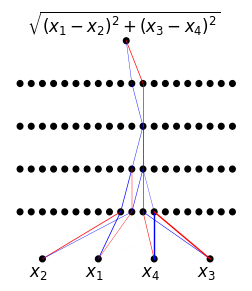

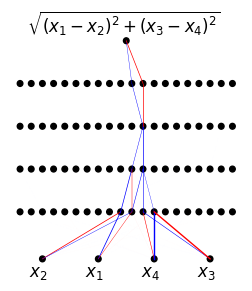

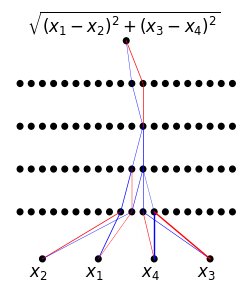

step = 14400 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.25e-03 | reg: 3.13e+00 


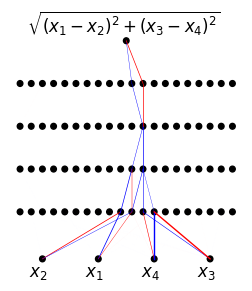

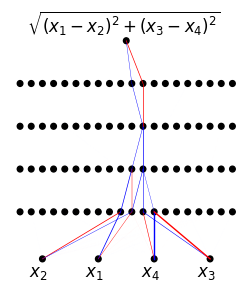

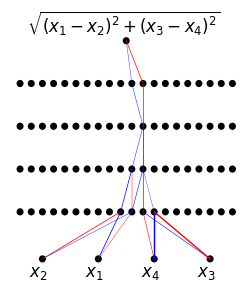

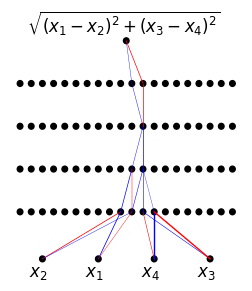

step = 14600 | total loss: 1.04e-02 | train loss: 1.02e-03 | test loss 1.24e-03 | reg: 3.13e+00 


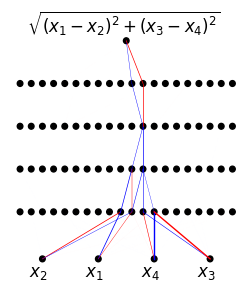

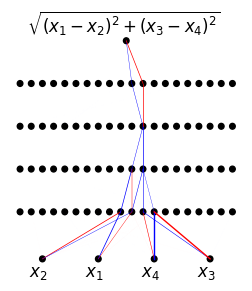

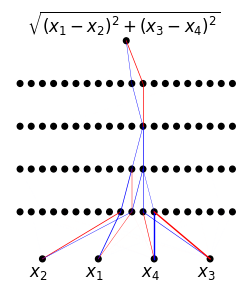

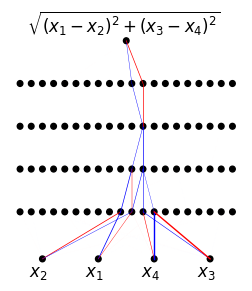

step = 14800 | total loss: 1.04e-02 | train loss: 1.03e-03 | test loss 1.23e-03 | reg: 3.12e+00 


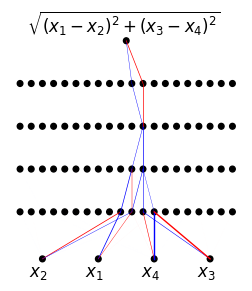

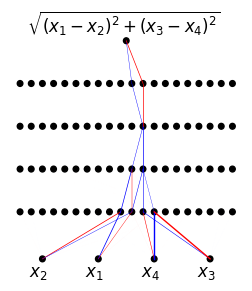

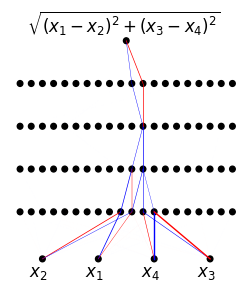

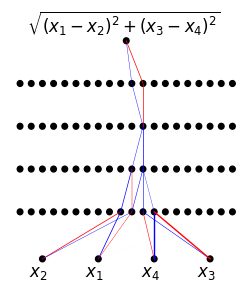

step = 15000 | total loss: 1.47e-02 | train loss: 1.03e-03 | test loss 1.25e-03 | reg: 4.57e+00 


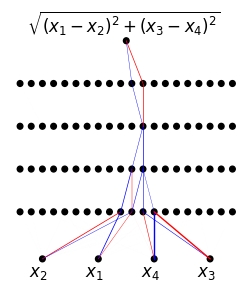

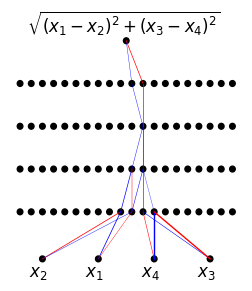

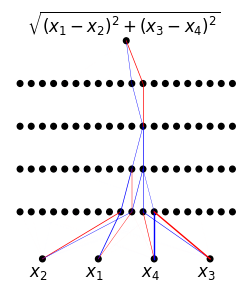

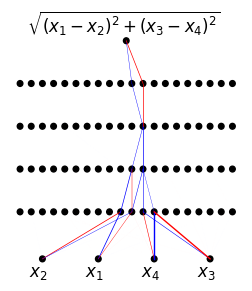

step = 15200 | total loss: 1.29e-02 | train loss: 1.04e-03 | test loss 1.26e-03 | reg: 3.95e+00 


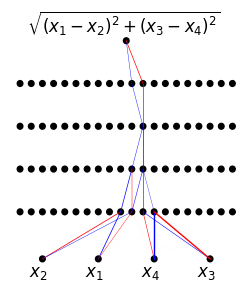

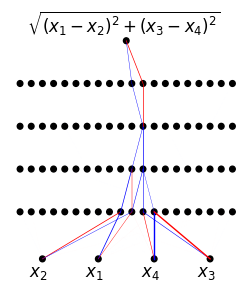

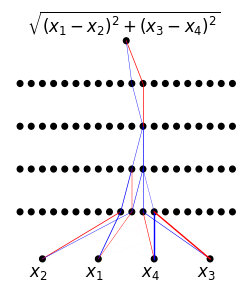

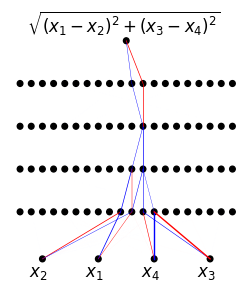

step = 15400 | total loss: 1.28e-02 | train loss: 1.04e-03 | test loss 1.24e-03 | reg: 3.93e+00 


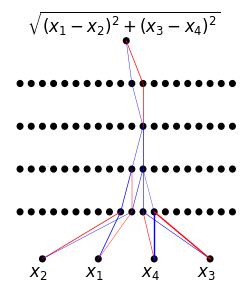

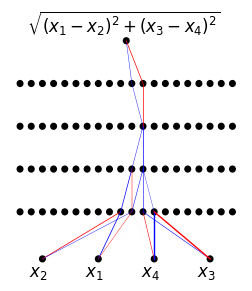

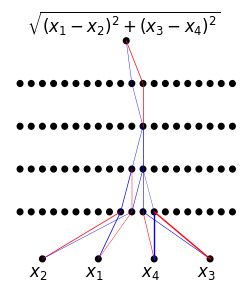

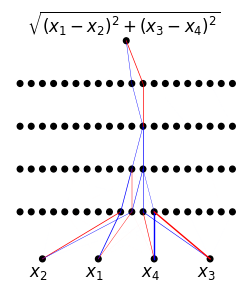

step = 15600 | total loss: 1.28e-02 | train loss: 1.05e-03 | test loss 1.28e-03 | reg: 3.92e+00 


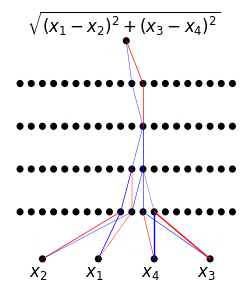

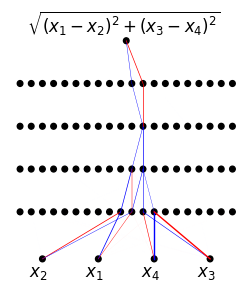

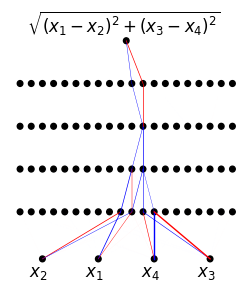

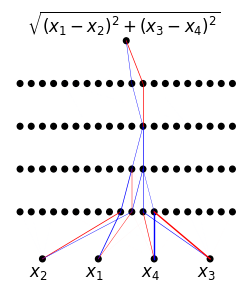

step = 15800 | total loss: 1.27e-02 | train loss: 1.06e-03 | test loss 1.26e-03 | reg: 3.90e+00 


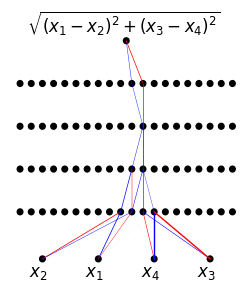

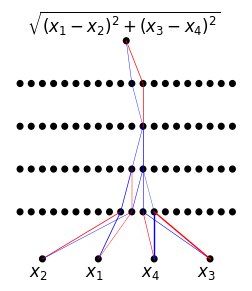

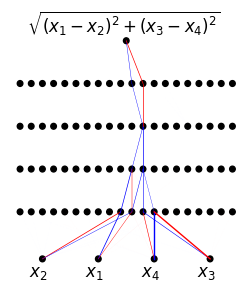

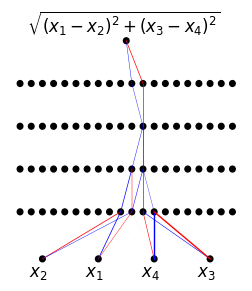

step = 16000 | total loss: 1.27e-02 | train loss: 1.06e-03 | test loss 1.27e-03 | reg: 3.89e+00 


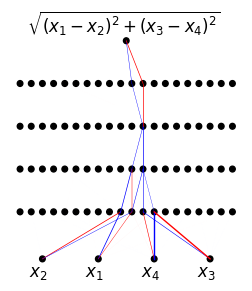

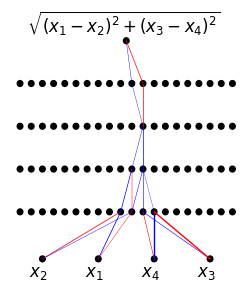

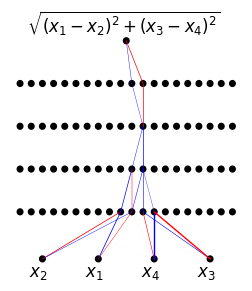

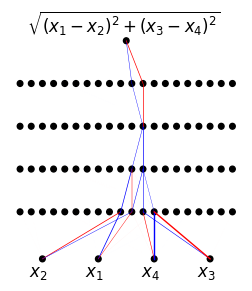

step = 16200 | total loss: 1.27e-02 | train loss: 1.07e-03 | test loss 1.29e-03 | reg: 3.87e+00 


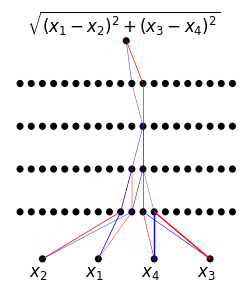

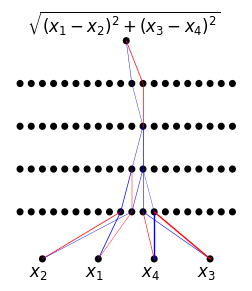

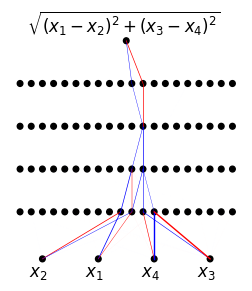

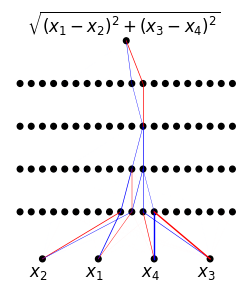

step = 16400 | total loss: 1.26e-02 | train loss: 1.08e-03 | test loss 1.30e-03 | reg: 3.86e+00 


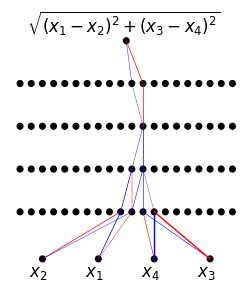

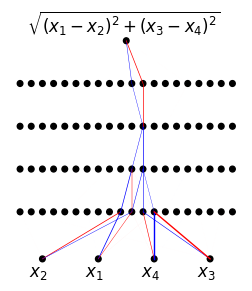

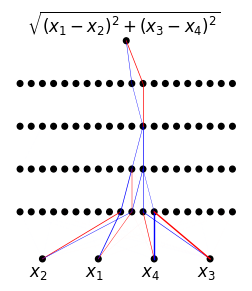

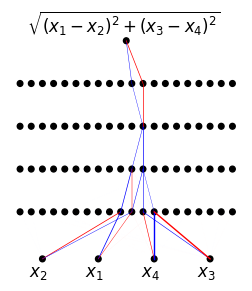

step = 16600 | total loss: 1.26e-02 | train loss: 1.09e-03 | test loss 1.34e-03 | reg: 3.84e+00 


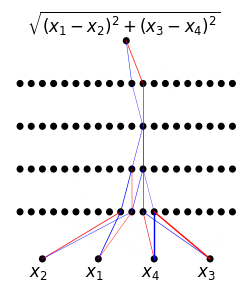

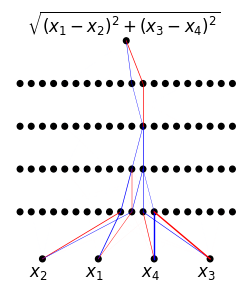

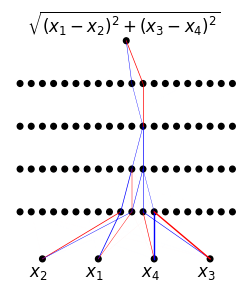

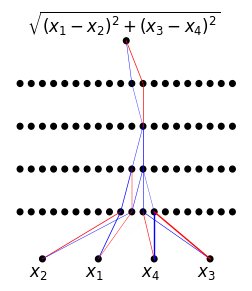

step = 16800 | total loss: 1.26e-02 | train loss: 1.09e-03 | test loss 1.33e-03 | reg: 3.83e+00 


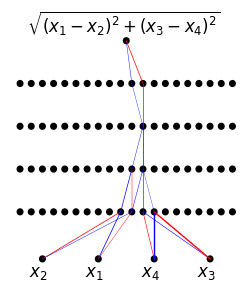

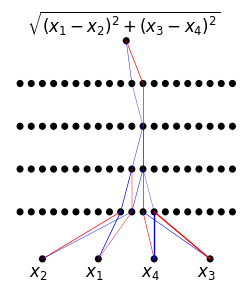

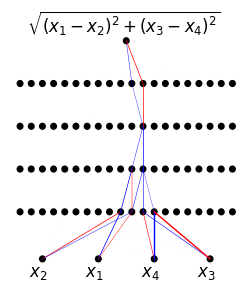

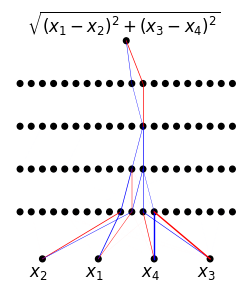

step = 17000 | total loss: 1.25e-02 | train loss: 1.10e-03 | test loss 1.32e-03 | reg: 3.82e+00 


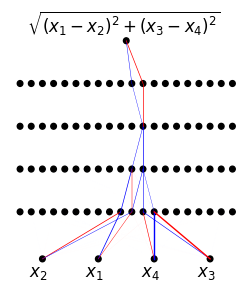

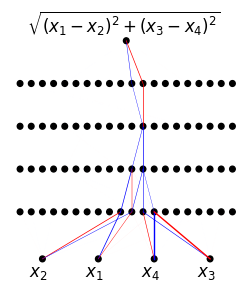

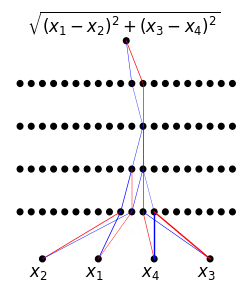

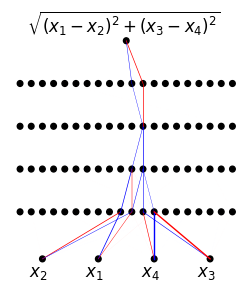

step = 17200 | total loss: 1.25e-02 | train loss: 1.10e-03 | test loss 1.35e-03 | reg: 3.81e+00 


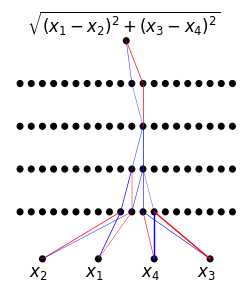

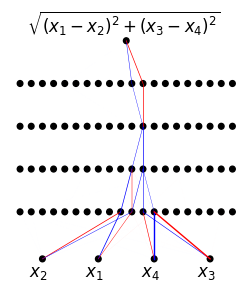

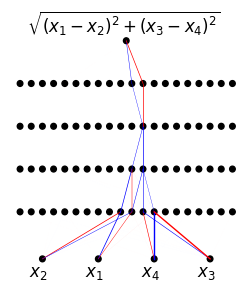

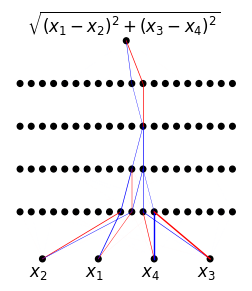

step = 17400 | total loss: 1.25e-02 | train loss: 1.11e-03 | test loss 1.35e-03 | reg: 3.81e+00 


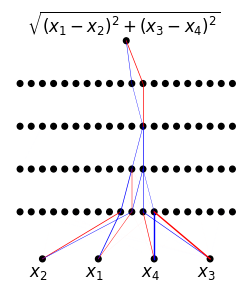

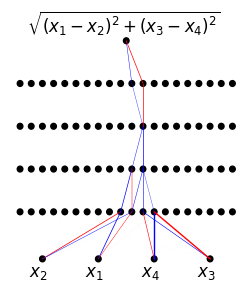

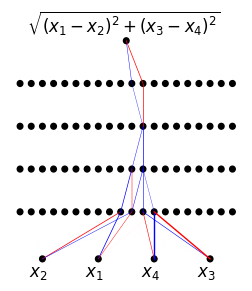

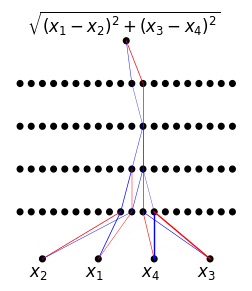

step = 17600 | total loss: 1.25e-02 | train loss: 1.12e-03 | test loss 1.38e-03 | reg: 3.80e+00 


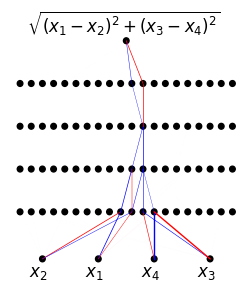

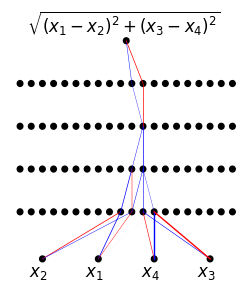

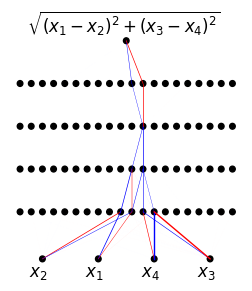

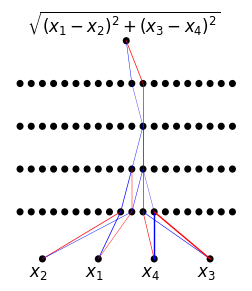

step = 17800 | total loss: 1.25e-02 | train loss: 1.12e-03 | test loss 1.38e-03 | reg: 3.79e+00 


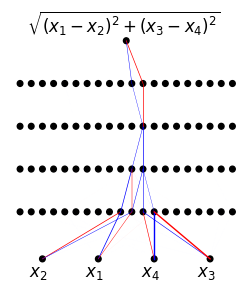

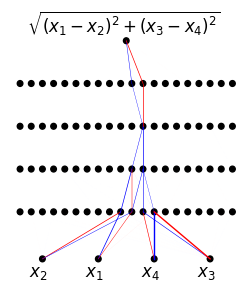

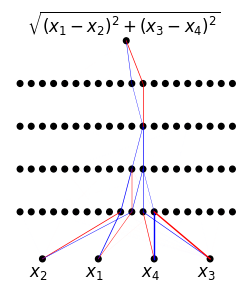

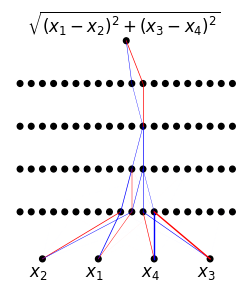

step = 18000 | total loss: 1.25e-02 | train loss: 1.12e-03 | test loss 1.36e-03 | reg: 3.78e+00 


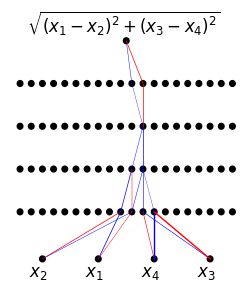

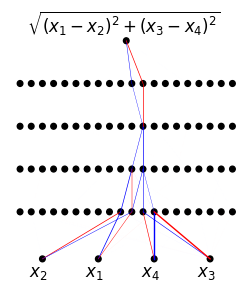

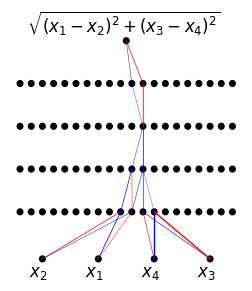

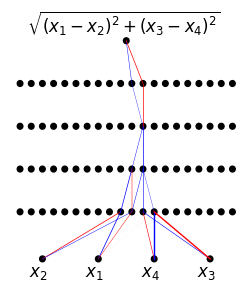

step = 18200 | total loss: 1.24e-02 | train loss: 1.13e-03 | test loss 1.38e-03 | reg: 3.77e+00 


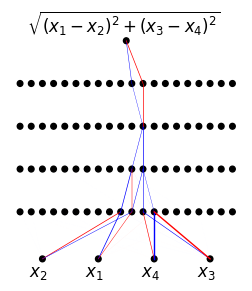

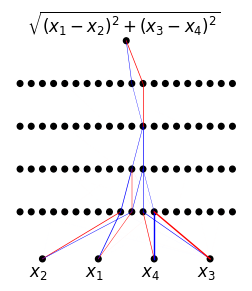

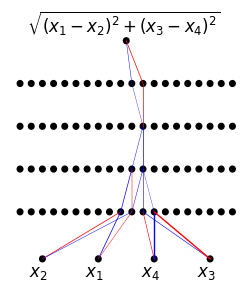

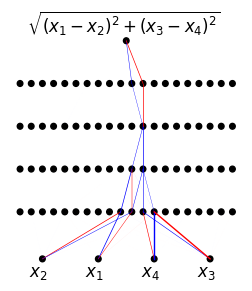

step = 18400 | total loss: 1.24e-02 | train loss: 1.13e-03 | test loss 1.36e-03 | reg: 3.77e+00 


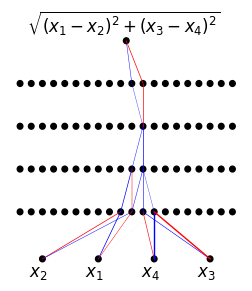

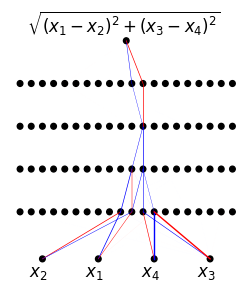

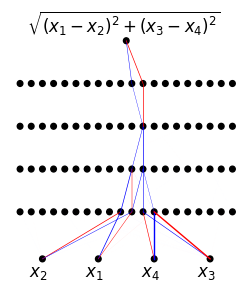

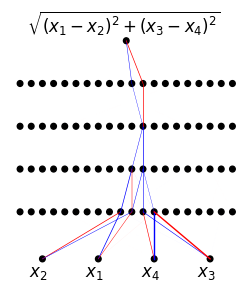

step = 18600 | total loss: 1.24e-02 | train loss: 1.14e-03 | test loss 1.38e-03 | reg: 3.76e+00 


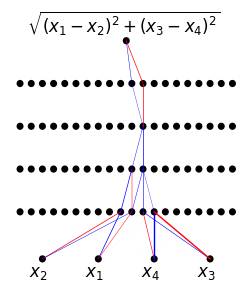

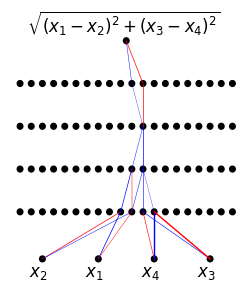

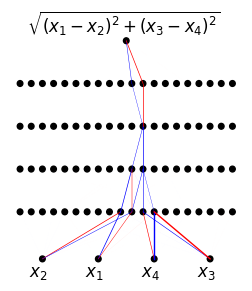

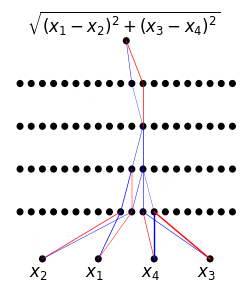

step = 18800 | total loss: 1.24e-02 | train loss: 1.14e-03 | test loss 1.39e-03 | reg: 3.75e+00 


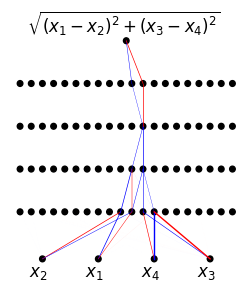

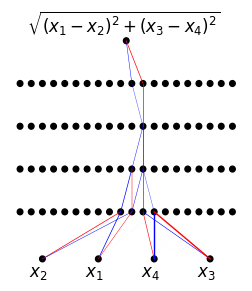

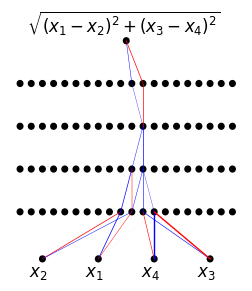

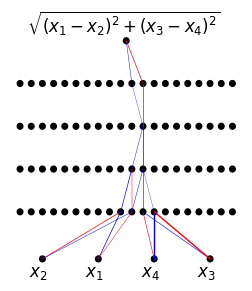

step = 19000 | total loss: 1.24e-02 | train loss: 1.15e-03 | test loss 1.39e-03 | reg: 3.75e+00 


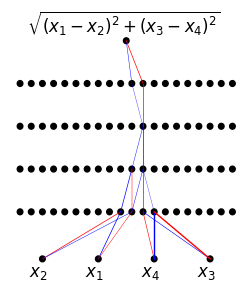

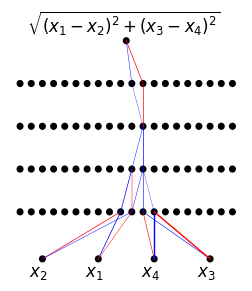

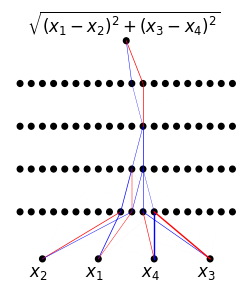

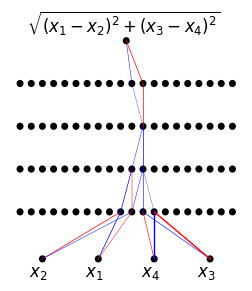

step = 19200 | total loss: 1.24e-02 | train loss: 1.16e-03 | test loss 1.39e-03 | reg: 3.74e+00 


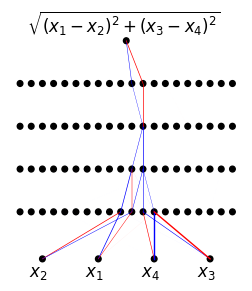

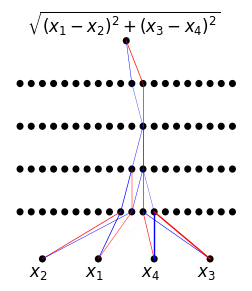

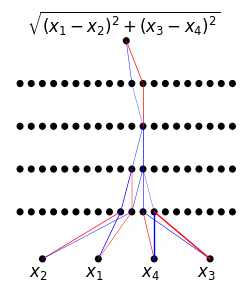

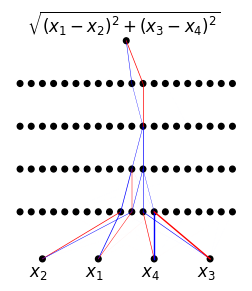

step = 19400 | total loss: 1.24e-02 | train loss: 1.17e-03 | test loss 1.43e-03 | reg: 3.74e+00 


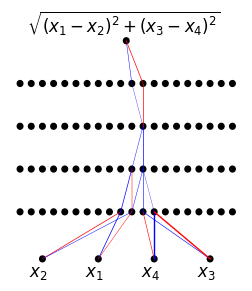

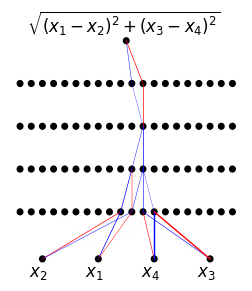

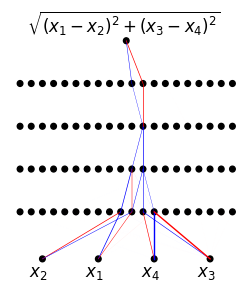

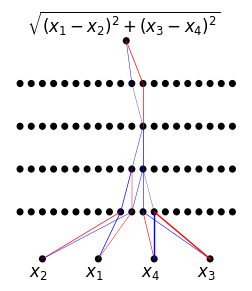

step = 19600 | total loss: 1.24e-02 | train loss: 1.18e-03 | test loss 1.44e-03 | reg: 3.74e+00 


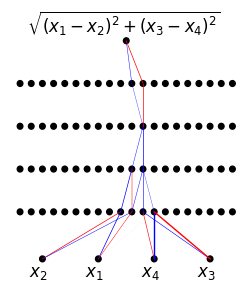

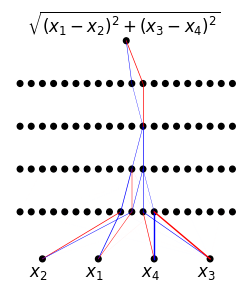

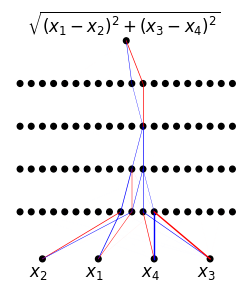

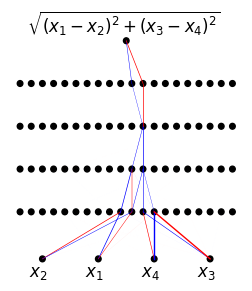

step = 19800 | total loss: 1.24e-02 | train loss: 1.18e-03 | test loss 1.44e-03 | reg: 3.73e+00 


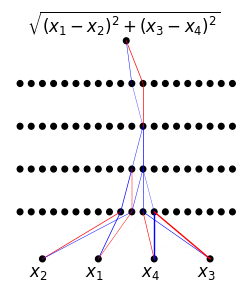

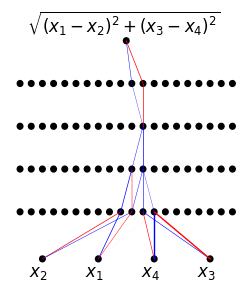

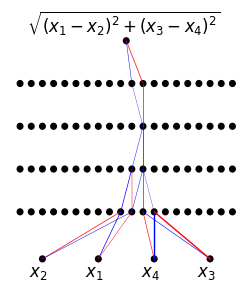

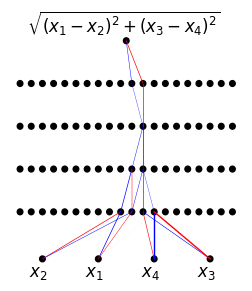

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F


# create dataset

seed = 3
np.random.seed(seed)
torch.manual_seed(seed)


def f(data):
    x1 = data[:,[0]]
    x2 = data[:,[1]]
    x3 = data[:,[2]]
    x4 = data[:,[3]]
    #out = np.transpose(np.array([(x1+x3)**3, x2**2+np.sin(np.pi*x4)]))
    #out = np.transpose(np.array([x1**2, x1**2+x2**2, x1**2+x2**2+x3**2]))
    out = np.transpose(np.array([np.sqrt((x1-x2)**2+(x3-x4)**2)]))
    return out


d_in = 4
d_out = 1

inputs = np.random.rand(100,d_in)*2-1
labels = f(inputs)

inputs = torch.tensor(inputs, dtype=torch.float, requires_grad=True)
labels = torch.tensor(labels, dtype=torch.float, requires_grad=True)

inputs_test = np.random.rand(100,d_in)*2-1
labels_test = f(inputs_test)

inputs_test = torch.tensor(inputs_test, dtype=torch.float, requires_grad=True)
labels_test = torch.tensor(labels_test, dtype=torch.float, requires_grad=True)


width = 20
depth = 5
shp = [d_in, 20, 20, 20, 20, d_out]


model = BioMLP(shp=shp)

# train_type = 1; no L1
# train_type = 2; L1
# train_type = 3: L1 + Local
# train_type = 4: L1 + Swap
# train_type = 5: L1 + Local + Swap
train_type = 5

optimizer = torch.optim.AdamW(model.parameters(), lr=0.002, weight_decay=0.0)
log = 200
lamb = 0 if train_type==1 else 0.001
swap_log = 200 if train_type >= 4 else float('inf')
weight_factor = 1. if train_type == 3 or train_type == 5 else 0.
plot_log = 50
steps = 20000
 
for step in range(steps):
    
    if step == int(steps/4):
        lamb *= 3
    
    if step == int(3*steps/4):
        lamb *= 1
    
    optimizer.zero_grad()
    pred  = model(inputs)
    loss = torch.mean((pred-labels)**2)
    pred_test  = model(inputs_test)
    loss_test = torch.mean((pred_test-labels_test)**2)
    
    # do not penalize bias at first (this makes the weight graph look better)
    if step < int(3*steps/4):
        reg = model.get_cc(bias_penalize=False, weight_factor=weight_factor)
    else:
        reg = model.get_cc(bias_penalize=True, weight_factor=weight_factor)
    #reg = model.get_cc(bias_penalize=True)
    total_loss = loss + lamb*reg
    total_loss.backward()
    optimizer.step()
    
    if step % log == 0:
        print("step = %d | total loss: %.2e | train loss: %.2e | test loss %.2e | reg: %.2e "%(step, total_loss.detach().numpy(), loss.detach().numpy(), loss_test.detach().numpy(), reg.detach().numpy()))
    
    if (step+1) % swap_log == 0:
        model.relocate()

    if step % plot_log == 0:
        model.plot()
        formulas = [r"$\sqrt{(x_1-x_2)^2+(x_3-x_4)^2}$"]
        fontsize = 12
        for j in range(shp[0]):
            plt.text(1/(2*shp[1])+5*j/shp[1]+0.04, -0.05, "$x_{}$".format(model.in_perm[j].long()+1), fontsize=fontsize)

        for j in range(shp[-1]):
            plt.text(1/(2*shp[0])+j/shp[0]-0.07, 0.1*(len(shp)-1)+0.02, formulas[model.out_perm[j].long()], fontsize=fontsize)
    
        #plt.savefig("./video_figs/sf_comp/{0:05d}.png".format(step))
        plt.show()
    

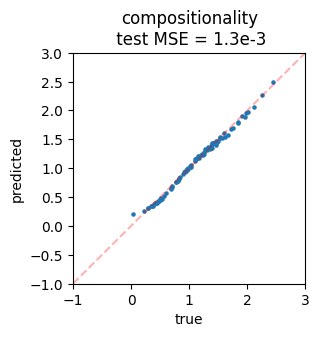

In [8]:
plt.figure(figsize=(3,3))
plt.plot([-6,6],[-6,6],ls="--",color="red", alpha=0.3)
plt.scatter(labels_test.detach().numpy(), pred_test.detach().numpy(), s=5)
plt.xlim(-1,3)
plt.ylim(-1,3)
plt.xlabel("true")
plt.ylabel("predicted")
plt.title("compositionality\n test MSE = 1.3e-3")
plt.savefig("./fig/compositionality_compare.png", bbox_inches="tight")